In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from rdkit import Chem
from rdkit.Chem import Crippen
from rdkit.Chem import Descriptors

# 랜덤한 a와 b 생성
# a = random.uniform(0, 10)
# b = random.uniform(-200, 200)
a = 6.462356980390821
b = -162.75140504630065

# 데이터 불러오기
esol = pd.read_csv('../delaney-processed.csv')

# 'aM_w+b' 열 추가 (분자량은 4번째 열에 있다고 가정)
esol['smiles_len'] = esol['smiles'].apply(len)
esol['aM_w+b'] = a * esol.loc[:, 'Molecular Weight'] + b

# RDKit를 사용하여 물성 값들 계산
esol['LogP'] = esol['smiles'].apply(lambda x: Descriptors.MolLogP(Chem.MolFromSmiles(x)))
esol['TPSA'] = esol['smiles'].apply(lambda x: Descriptors.TPSA(Chem.MolFromSmiles(x)))
esol['sp3'] = esol['smiles'].apply(lambda x: Descriptors.FractionCSP3(Chem.MolFromSmiles(x)))
esol['MolMR'] = esol['smiles'].apply(lambda x: Descriptors.MolMR(Chem.MolFromSmiles(x)))
esol['BJ'] = esol['smiles'].apply(lambda x: Descriptors.BalabanJ(Chem.MolFromSmiles(x)))
esol['Chi'] = esol['smiles'].apply(lambda x: Descriptors.Chi1v(Chem.MolFromSmiles(x)))
esol['HKA'] = esol['smiles'].apply(lambda x: Descriptors.HallKierAlpha(Chem.MolFromSmiles(x)))

print(f"a = {a}, b = {b}")

# Robust Z-score 정규화 함수
def robust_zscore(values, mode):
   """
   Robust Z-score 정규화 함수
   median과 MAD(Median Absolute Deviation)를 사용
   """
   values = np.array(values)
   
   # NaN 값 처리
   valid_mask = ~np.isnan(values)
   if not np.any(valid_mask):
       return values  # 모든 값이 NaN인 경우
   
   valid_values = values[valid_mask]
   
   # Median 계산
   median = np.median(valid_values)
   
   # MAD (Median Absolute Deviation) 계산
   mad = np.median(np.abs(valid_values - median))
   
   # MAD가 0인 경우 (모든 값이 같은 경우) 처리
   if mad == 0:
       return np.zeros_like(values)
   
   # 정규분포 가정 하의 보정계수 1.4826
   # (MAD * 1.4826 ≈ standard deviation for normal distribution)
   robust_std = 1.4826 * mad
   
   # Robust Z-score 계산 ##################################################
   robust_z = (values - median) / robust_std
   if mode == 0:
      return robust_z
   elif mode == 1:
      return robust_z * 1000
   elif mode == 2:
      return robust_z ** 2
   elif mode == 3:
      return np.log(np.abs(robust_z + 1e-3)) + 500 # log 변환 (0으로 나누는 오류 방지)
   elif mode == 4:
      return np.sin(10 * robust_z)
   elif mode == 5:
      return np.exp(robust_z - 10)
      
# 정규화할 물성들 리스트return 500 * np.sin(5 * robust_z)elif mode == 4:

properties_to_normalize = ['Molecular Weight', 'LogP', 'TPSA', 'sp3', 'MolMR', 'BJ', 'Chi', 'HKA']

# 원본 통계량 저장을 위한 딕셔너리
original_stats = {}
normalized_stats = {}

print("\n=== 원본 데이터 통계량 ===")
for prop in properties_to_normalize:
   values = esol[prop].values
   
   # 원본 통계량 계산
   original_stats[prop] = {
       'mean': np.mean(values),
       'median': np.median(values),
       'std': np.std(values),
       'mad': np.median(np.abs(values - np.median(values))),
       'min': np.min(values),
       'max': np.max(values),
       'outlier_ratio': np.sum(np.abs(values - np.mean(values)) > 3 * np.std(values)) / len(values)
   }
   
   print(f"\n{prop}:")
   print(f"  Mean: {original_stats[prop]['mean']:.3f}")
   print(f"  Median: {original_stats[prop]['median']:.3f}")
   print(f"  Std: {original_stats[prop]['std']:.3f}")
   print(f"  MAD: {original_stats[prop]['mad']:.3f}")
   print(f"  Range: [{original_stats[prop]['min']:.3f}, {original_stats[prop]['max']:.3f}]")
   print(f"  Outlier ratio (>3σ): {original_stats[prop]['outlier_ratio']:.3f}")

print("\n=== Robust Z-score 정규화 수행 ===")

# 각 물성에 대해 Robust Z-score 정규화 수행
for prop in properties_to_normalize:
   # 새로운 컬럼명 생성
   normalized_col = f"{prop}_robust_zscore"
   lt_col = f"{prop}_lt"
   sq_col = f"{prop}_sq"
   lg_col = f"{prop}_lg"
   sn_col = f"{prop}_sn"
   ex_col = f"{prop}_ex"

   # Robust Z-score 정규화 적용
   esol[normalized_col] = robust_zscore(esol[prop], 0)
   esol[lt_col] = robust_zscore(esol[prop], 1)
   esol[sq_col] = robust_zscore(robust_zscore(esol[prop], 2), 0)
   esol[lg_col] = robust_zscore(robust_zscore(esol[prop], 3), 0)
   esol[sn_col] = robust_zscore(robust_zscore(esol[prop], 4), 0)
   esol[ex_col] = robust_zscore(robust_zscore(esol[prop], 5), 0)

   # 정규화 후 통계량 계산
   normalized_values = esol[normalized_col].values
   normalized_stats[prop] = {
       'mean': np.mean(normalized_values),
       'median': np.median(normalized_values),
       'std': np.std(normalized_values),
       'mad': np.median(np.abs(normalized_values - np.median(normalized_values))),
       'min': np.min(normalized_values),
       'max': np.max(normalized_values)
   }
   
   print(f"\n{prop} -> {normalized_col}:")
   print(f"  정규화 후 Mean: {normalized_stats[prop]['mean']:.6f}")
   print(f"  정규화 후 Median: {normalized_stats[prop]['median']:.6f}")
   print(f"  정규화 후 Std: {normalized_stats[prop]['std']:.3f}")
   print(f"  정규화 후 MAD: {normalized_stats[prop]['mad']:.6f}")
   print(f"  정규화 후 Range: [{normalized_stats[prop]['min']:.3f}, {normalized_stats[prop]['max']:.3f}]")

# 정규화 검증
print("\n=== 정규화 검증 ===")
print("Robust Z-score의 특성:")
print("- Median = 0 (정확히 0)")
print("- MAD = 1/1.4826 ≈ 0.6745 (이론값)")
print("\n실제 값들:")
for prop in properties_to_normalize:
   normalized_col = f"{prop}_robust_zscore"
   median_val = normalized_stats[prop]['median']
   mad_val = normalized_stats[prop]['mad']
   theoretical_mad = 1/1.4826
   
   print(f"{prop}:")
   print(f"  Median: {median_val:.6f} (이론값: 0)")
   print(f"  MAD: {mad_val:.6f} (이론값: {theoretical_mad:.6f})")

# 데이터프레임의 새로운 컬럼들 확인
print(f"\n=== 최종 데이터프레임 정보 ===")
print(f"전체 컬럼 수: {len(esol.columns)}")
print("정규화된 컬럼들:")
for prop in properties_to_normalize:
   normalized_col = f"{prop}_robust_zscore"
   print(f"  {normalized_col}")

# 샘플 데이터 확인
print(f"\n=== 샘플 데이터 (첫 5행) ===")
cols_to_show = properties_to_normalize + [f"{prop}_robust_zscore" for prop in properties_to_normalize]
print(esol[cols_to_show].head())

# 선택적: 히스토그램으로 정규화 전후 비교
def plot_before_after_histograms(prop_name, save_plots=False):
   """정규화 전후 히스토그램 비교"""
   fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
   
   # 원본 데이터 히스토그램
   ax1.hist(esol[prop_name], bins=50, alpha=0.7, color='blue', edgecolor='black')
   ax1.set_title(f'Original {prop_name}')
   ax1.set_xlabel(prop_name)
   ax1.set_ylabel('Frequency')
   ax1.grid(True, alpha=0.3)
   
   # 정규화된 데이터 히스토그램
   normalized_col = f"{prop_name}_robust_zscore"
   ax2.hist(esol[normalized_col], bins=50, alpha=0.7, color='red', edgecolor='black')
   ax2.set_title(f'Robust Z-score Normalized {prop_name}')
   ax2.set_xlabel(f'{prop_name} (Robust Z-score)')
   ax2.set_ylabel('Frequency')
   ax2.grid(True, alpha=0.3)
   
   plt.tight_layout()
   
   if save_plots:
       plt.savefig(f'robust_zscore_{prop_name.replace(" ", "_")}.png', dpi=300, bbox_inches='tight')
   
   plt.show()

# 예시: 몇 개 물성의 히스토그램 확인 (선택적으로 실행)
print("\n히스토그램을 확인하려면 다음 함수들을 실행하세요:")
print("plot_before_after_histograms('Molecular Weight')")
print("plot_before_after_histograms('LogP')")
print("plot_before_after_histograms('sp3')")

a = 6.462356980390821, b = -162.75140504630065

=== 원본 데이터 통계량 ===

Molecular Weight:
  Mean: 203.937
  Median: 182.179
  Std: 102.693
  MAD: 70.137
  Range: [16.043, 780.949]
  Outlier ratio (>3σ): 0.004

LogP:
  Mean: 2.448
  Median: 2.339
  Std: 1.852
  MAD: 0.986
  Range: [-7.571, 10.389]
  Outlier ratio (>3σ): 0.012

TPSA:
  Mean: 34.873
  Median: 26.300
  Std: 35.368
  MAD: 26.300
  Range: [0.000, 268.680]
  Outlier ratio (>3σ): 0.011

sp3:
  Mean: 0.444
  Median: 0.357
  Std: 0.375
  MAD: 0.357
  Range: [0.000, 1.000]
  Outlier ratio (>3σ): 0.000

MolMR:
  Mean: 54.016
  Median: 48.523
  Std: 25.268
  MAD: 17.355
  Range: [6.731, 192.611]
  Outlier ratio (>3σ): 0.004

BJ:
  Mean: 2.676
  Median: 2.723
  Std: 0.573
  MAD: 0.355
  Range: [0.000, 4.808]
  Outlier ratio (>3σ): 0.011

Chi:
  Mean: 4.899
  Median: 4.264
  Std: 2.613
  MAD: 1.602
  Range: [0.000, 20.941]
  Outlier ratio (>3σ): 0.009

HKA:
  Mean: -0.920
  Median: -0.920
  Std: 1.010
  MAD: 0.720
  Range: [-4.680, 3.480

[t-SNE] Computing 44 nearest neighbors...
[t-SNE] Indexed 45 samples in 0.000s...
[t-SNE] Computed neighbors for 45 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 45 / 45
[t-SNE] Mean sigma: 2.265978
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.204117
[t-SNE] KL divergence after 1100 iterations: 0.102255


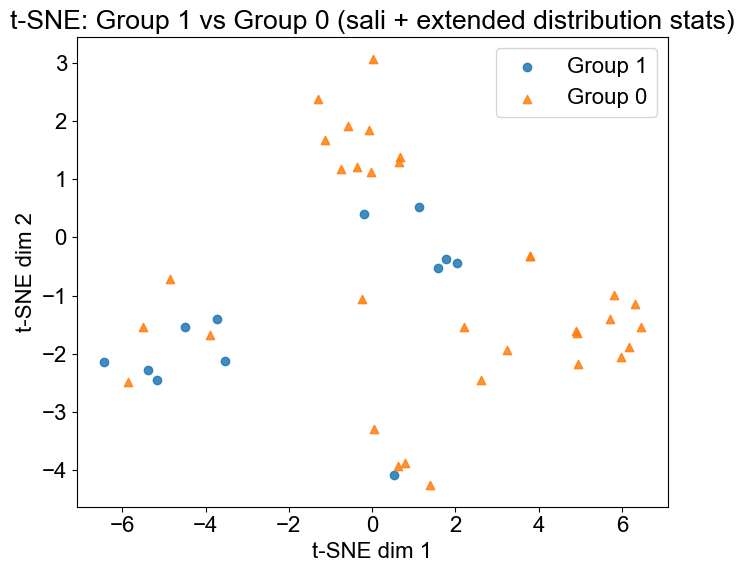

Saved: tsne_features_with_extended_stats.csv


In [134]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# 1) sali 통합 csv 읽기
sali_df = pd.read_csv("sali_mae_ratio_integrated.csv")

# 2) esol_col 매핑 함수
base_map = {
    "mw": "Molecular Weight",
    "logp": "LogP",
    "tpsa": "TPSA",
    "sp3": "sp3",
    "mr": "MolMR",
    "bj": "BJ",
    "chi": "Chi",
    "hka": "HKA",
}
suffix_map = {
    "raw": "",
    "robust_zscore": "_robust_zscore",
    "lt": "_lt",
    "sq": "_sq",
    "lg": "_lg",
    "sn": "_sn",
    "ex": "_ex",
}

def esol_col_name(task, prop):
    base = base_map.get(str(prop).strip())
    suff = suffix_map.get(str(task).strip(), "")
    return f"{base}{suff}" if base else None

# 3) label 컬럼 안전하게 찾기: 'sali_avg' 다음 열을 label로 사용
if "sali_avg" not in sali_df.columns:
    raise ValueError("CSV에 'sali_avg' 열이 필요합니다.")
label_idx = sali_df.columns.get_loc("sali_avg") + 1
if label_idx >= len(sali_df.columns):
    raise ValueError("sali_avg 다음에 label(1/0/nan) 열이 필요합니다.")
label_col = sali_df.columns[label_idx]

# 4) esol_col 생성
sali_df["esol_col"] = sali_df.apply(lambda r: esol_col_name(r["task"], r["property"]), axis=1)

# 5) label 정리
def normalize_label(x):
    try:
        v = float(x)
    except Exception:
        return np.nan
    if np.isnan(v):
        return np.nan
    if v in (0.0, 1.0):
        return int(v)
    return np.nan

sali_df["label"] = sali_df[label_col].apply(normalize_label)
sali_df = sali_df.dropna(subset=["label"])
sali_df["label"] = sali_df["label"].astype(int)

# 6) 사용할 sali/메타 컬럼
# sali_cols = [c for c in ["sali_maccs"] if c in sali_df.columns]
sali_cols = [c for c in ["sali_ecfp","sali_rdkit","sali_maccs"] if c in sali_df.columns]
# 7) 확장 통계량 계산 함수 (분포 형태 지표 포함)
def compute_stats_extended(values: np.ndarray):
    x = np.asarray(values, dtype=float)
    x = x[np.isfinite(x)]
    n = len(x)
    if n == 0:
        return {k: np.nan for k in [
            "mean","median","std","mad","min","max",
            "q25","q75","iqr","q10","q90","q1","q5","q95","q99",
            "skewness","kurtosis_excess",
            "entropy_hist","entropy_norm",
            "asymmetry_ratio","tail_ratio","iqr_to_range","median_norm_range",
            "gini","theil",
            "bowley_skew","kelly_skew","moors_kurtosis",
            "p99_p1_over_iqr","p95_p5_over_p90_p10","iqr_over_p90_p10"
        ]}
    
    eps = 1e-12
    mean  = float(np.nanmean(x))
    median = float(np.nanmedian(x))
    std = float(np.nanstd(x, ddof=1)) if np.nanstd(x) > 0 else 0.0
    mad = float(np.nanmedian(np.abs(x - np.nanmedian(x))))
    xmin = float(np.nanmin(x))
    xmax = float(np.nanmax(x))
    q25 = float(np.nanpercentile(x, 25))
    q75 = float(np.nanpercentile(x, 75))
    iqr = float(q75 - q25)
    q10 = float(np.nanpercentile(x, 10))
    q90 = float(np.nanpercentile(x, 90))
    q1  = float(np.nanpercentile(x, 1))
    q5  = float(np.nanpercentile(x, 5))
    q95 = float(np.nanpercentile(x, 95))
    q99 = float(np.nanpercentile(x, 99))
    xrng = float(xmax - xmin)

    # Skewness & Kurtosis
    if std > 0:
        z = (x - mean) / std
        skewness = float(np.nanmean(z**3))
        kurtosis_excess = float(np.nanmean(z**4) - 3.0)
    else:
        skewness = 0.0
        kurtosis_excess = 0.0

    # Shannon Entropy
    hist, _ = np.histogram(x, bins=32, density=True)
    p = hist / (hist.sum() + eps)
    p = p[p > 0]
    entropy_hist = float(-np.sum(p * np.log(p + eps)))
    entropy_norm = float(entropy_hist / np.log(32))  # 정규화 엔트로피

    # 분위수 기반 skew/kurtosis
    bowley_skew = (q75 + q25 - 2*median) / (q75 - q25 + eps)
    kelly_skew = (q90 + q10 - 2*median) / (q90 - q10 + eps)
    moors_kurtosis = ((q75 - q25) + (q90 - q10)) / (q90 - q10 + eps)

    # --- 비율 지표 ---
    asymmetry_ratio = (q75 - median) / (median - q25 + eps)  # 좌우 비대칭
    tail_ratio = (q90 - q10) / (iqr + eps)                   # 꼬리 두께
    iqr_to_range = iqr / (xrng + eps)                        # 범위 대비 IQR
    median_norm_range = (xmax - xmin) / (abs(median) + eps)  # 중앙값 기반 정규화

    # --- 극단 분위수 지표 ---
    p99_p1_over_iqr = (q99 - q1) / (iqr + eps)
    p95_p5_over_p90_p10 = (q95 - q5) / (q90 - q10 + eps)
    iqr_over_p90_p10 = iqr / (q90 - q10 + eps)

    # 불평등 지표: Gini, Theil
    if n > 0:
        x_pos = x - np.min(x) + eps  # 음수 없게 shift
        x_sorted = np.sort(x_pos)
        cumx = np.cumsum(x_sorted)
        gini = 1 - 2 * np.sum(cumx) / (n * cumx[-1]) + (n + 1) / n
        p = x_pos / (np.sum(x_pos) + eps)
        theil = np.sum(p * np.log(p * n + eps))
    else:
        gini = np.nan
        theil = np.nan

    return {
        # "mean": mean,
        # "median": median,
        # "std": std,
        # "mad": mad,
        # "min": xmin,
        # "max": xmax,
        # "q25": q25,
        # "q75": q75,
        # "iqr": iqr,
        # "q10": q10,
        # "q90": q90,
        # "q1": q1,
        # "q5": q5,
        # "q95": q95,
        # "q99": q99,

        "skewness": skewness,
        "kurtosis_excess": kurtosis_excess,
        "entropy_hist": entropy_hist,
        "entropy_norm": entropy_norm,
        "asymmetry_ratio": asymmetry_ratio,
        "tail_ratio": tail_ratio,
        "iqr_to_range": iqr_to_range,
        "median_norm_range": median_norm_range,
        "gini": gini,
        "theil": theil,
        "bowley_skew": bowley_skew,
        "kelly_skew": kelly_skew,
        "moors_kurtosis": moors_kurtosis,
        "p99_p1_over_iqr": p99_p1_over_iqr,
        "p95_p5_over_p90_p10": p95_p5_over_p90_p10,
        "iqr_over_p90_p10": iqr_over_p90_p10,
    }




# 8) feature matrix 구축
rows = []
for _, r in sali_df.iterrows():
    col = r["esol_col"]
    if not col or col not in esol.columns:
        continue

    vals = esol[col].values
    feats = compute_stats_extended(vals)

    # sali 값들 추가
    for sc in sali_cols:
        feats[sc] = float(r[sc]) if pd.notna(r[sc]) else np.nan

    # 메타 & 라벨
    feats["label"] = int(r["label"])
    feats["task"] = r.get("task", "")
    feats["property"] = r.get("property", "")
    feats["taskprop_name"] = r.get("taskprop_name", "")
    feats["esol_col"] = col
    rows.append(feats)

features = pd.DataFrame(rows)
if features.empty:
    raise RuntimeError("t-SNE에 사용할 feature가 비어 있습니다. esol 컬럼 매핑이나 label을 확인하세요.")

# 9) 수치/메타 분리 및 결측치 처리
meta_cols = ["label","task","property","taskprop_name","esol_col"]
num_cols = [c for c in features.columns if c not in meta_cols]

X = features[num_cols].copy()
for c in X.columns:
    med = np.nanmedian(X[c].to_numpy())
    if np.isnan(med):
        med = 0.0
    X[c] = X[c].fillna(med)

# 10) 표준화 & t-SNE
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

n_samples = X_scaled.shape[0]
perplexity = max(5, min(30, n_samples // 3))  # 자동 설정

tsne = TSNE(
    n_components=2,
    perplexity=perplexity,
    learning_rate="auto",
    init="pca",
    n_iter=10000,
    random_state=42,
    verbose=1
)
emb = tsne.fit_transform(X_scaled)

features["tsne_x"] = emb[:, 0]
features["tsne_y"] = emb[:, 1]

# 11) 시각화 (색상 지정 없이, 마커만 다르게)
plt.figure(figsize=(7,6))
mask1 = features["label"] == 1
mask0 = features["label"] == 0
plt.scatter(features.loc[mask1,"tsne_x"], features.loc[mask1,"tsne_y"], marker="o", alpha=0.85, label="Group 1")
plt.scatter(features.loc[mask0,"tsne_x"], features.loc[mask0,"tsne_y"], marker="^", alpha=0.85, label="Group 0")
plt.title("t-SNE: Group 1 vs Group 0 (sali + extended distribution stats)")
plt.xlabel("t-SNE dim 1")
plt.ylabel("t-SNE dim 2")
plt.legend()
plt.tight_layout()
plt.show()

# 12) 저장
features.to_csv("tsne_features_with_extended_stats.csv", index=False)
print("Saved:", "tsne_features_with_extended_stats.csv")

총 샘플 수: 45
라벨 분포: {0: 33, 1: 12}
Feature 수: 34

=== 로지스틱 회귀 모델 학습 ===
CV Accuracy: 0.733 ± 0.113

=== 분류 성능 ===
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        33
           1       1.00      0.83      0.91        12

    accuracy                           0.96        45
   macro avg       0.97      0.92      0.94        45
weighted avg       0.96      0.96      0.95        45


=== Top 20 중요한 Feature ===
                feature  coefficient  abs_coefficient
21         iqr_to_range    -1.292491         1.292491
25          bowley_skew     1.050752         1.050752
26           kelly_skew     0.901433         0.901433
28      p99_p1_over_iqr    -0.882419         0.882419
23                 gini    -0.604552         0.604552
19      asymmetry_ratio    -0.558895         0.558895
1                median     0.510578         0.510578
24                theil    -0.473544         0.473544
15             skewness     0.349177         0.

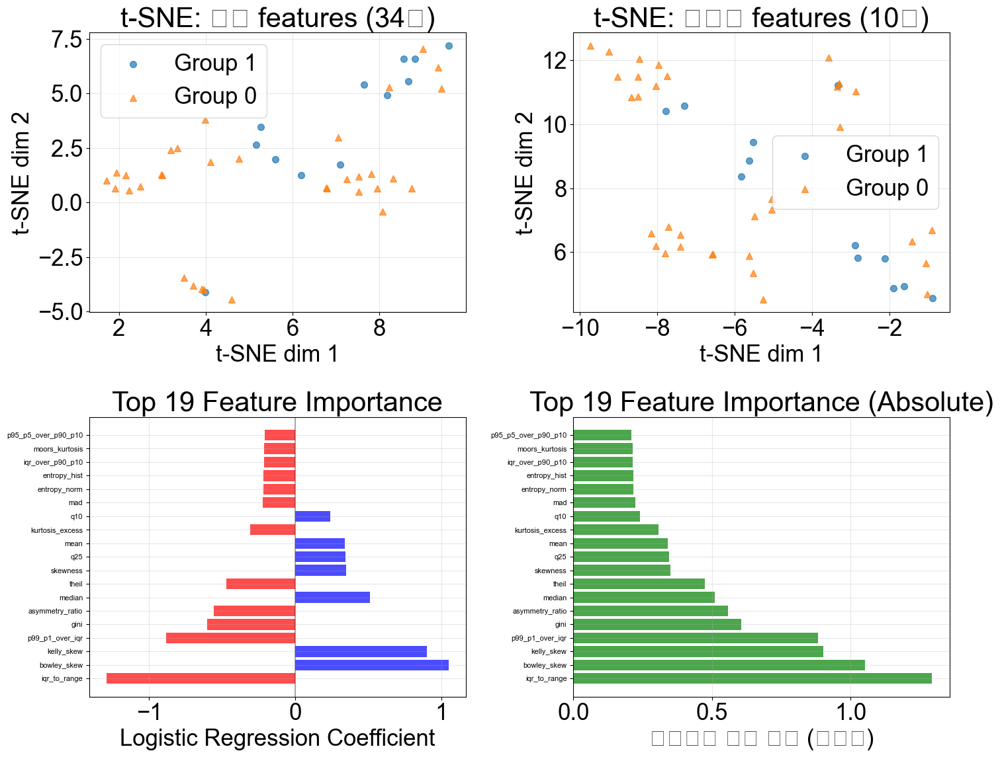


=== 선택된 10개 feature로 로지스틱 회귀 재학습 ===
CV Accuracy (선택된 features): 0.778 ± 0.099
CV Accuracy (모든 features):   0.733 ± 0.113

=== 선택된 Features 분류 성능 ===
              precision    recall  f1-score   support

           0       0.91      0.97      0.94        33
           1       0.90      0.75      0.82        12

    accuracy                           0.91        45
   macro avg       0.91      0.86      0.88        45
weighted avg       0.91      0.91      0.91        45


Feature importance 저장: feature_importance_logistic.csv
t-SNE 결과 저장: tsne_results_with_feature_selection.csv
선택된 features 저장: selected_features.csv

=== 분석 완료 ===
• 총 feature 수: 34
• 선택된 feature 수: 10
• 모든 features CV 정확도: 0.733
• 선택된 features CV 정확도: 0.778


In [210]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# 1) sali 통합 csv 읽기
sali_df = pd.read_csv("sali_mae_ratio_integrated.csv")

# 2) esol_col 매핑 함수
base_map = {
    "mw": "Molecular Weight",
    "logp": "LogP",
    "tpsa": "TPSA",
    "sp3": "sp3",
    "mr": "MolMR",
    "bj": "BJ",
    "chi": "Chi",
    "hka": "HKA",
}
suffix_map = {
    "raw": "",
    "robust_zscore": "_robust_zscore",
    "lt": "_lt",
    "sq": "_sq",
    "lg": "_lg",
    "sn": "_sn",
    "ex": "_ex",
}

def esol_col_name(task, prop):
    base = base_map.get(str(prop).strip())
    suff = suffix_map.get(str(task).strip(), "")
    return f"{base}{suff}" if base else None

# 3) label 컬럼 안전하게 찾기: 'sali_avg' 다음 열을 label로 사용
if "sali_avg" not in sali_df.columns:
    raise ValueError("CSV에 'sali_avg' 열이 필요합니다.")
label_idx = sali_df.columns.get_loc("sali_avg") + 1
if label_idx >= len(sali_df.columns):
    raise ValueError("sali_avg 다음에 label(1/0/nan) 열이 필요합니다.")
label_col = sali_df.columns[label_idx]

# 4) esol_col 생성
sali_df["esol_col"] = sali_df.apply(lambda r: esol_col_name(r["task"], r["property"]), axis=1)

# 5) label 정리
def normalize_label(x):
    try:
        v = float(x)
    except Exception:
        return np.nan
    if np.isnan(v):
        return np.nan
    if v in (0.0, 1.0):
        return int(v)
    return np.nan

sali_df["label"] = sali_df[label_col].apply(normalize_label)
sali_df = sali_df.dropna(subset=["label"])
sali_df["label"] = sali_df["label"].astype(int)

# 6) 사용할 sali/메타 컬럼
sali_cols = [c for c in ["sali_ecfp","sali_rdkit","sali_maccs"] if c in sali_df.columns]

# 7) 확장 통계량 계산 함수 (분포 형태 지표 포함)
def compute_stats_extended(values: np.ndarray):
    x = np.asarray(values, dtype=float)
    x = x[np.isfinite(x)]
    n = len(x)
    if n == 0:
        return {k: np.nan for k in [
            "mean","median","std","mad","min","max",
            "q25","q75","iqr","q10","q90","q1","q5","q95","q99",
            "skewness","kurtosis_excess",
            "entropy_hist","entropy_norm",
            "asymmetry_ratio","tail_ratio","iqr_to_range","median_norm_range",
            "gini","theil",
            "bowley_skew","kelly_skew","moors_kurtosis",
            "p99_p1_over_iqr","p95_p5_over_p90_p10","iqr_over_p90_p10"
        ]}
    
    eps = 1e-12
    mean  = float(np.nanmean(x))
    median = float(np.nanmedian(x))
    std = float(np.nanstd(x, ddof=1)) if np.nanstd(x) > 0 else 0.0
    mad = float(np.nanmedian(np.abs(x - np.nanmedian(x))))
    xmin = float(np.nanmin(x))
    xmax = float(np.nanmax(x))
    q25 = float(np.nanpercentile(x, 25))
    q75 = float(np.nanpercentile(x, 75))
    iqr = float(q75 - q25)
    q10 = float(np.nanpercentile(x, 10))
    q90 = float(np.nanpercentile(x, 90))
    q1  = float(np.nanpercentile(x, 1))
    q5  = float(np.nanpercentile(x, 5))
    q95 = float(np.nanpercentile(x, 95))
    q99 = float(np.nanpercentile(x, 99))
    xrng = float(xmax - xmin)

    # Skewness & Kurtosis
    if std > 0:
        z = (x - mean) / std
        skewness = float(np.nanmean(z**3))
        kurtosis_excess = float(np.nanmean(z**4) - 3.0)
    else:
        skewness = 0.0
        kurtosis_excess = 0.0

    # Shannon Entropy
    hist, _ = np.histogram(x, bins=32, density=True)
    p = hist / (hist.sum() + eps)
    p = p[p > 0]
    entropy_hist = float(-np.sum(p * np.log(p + eps)))
    entropy_norm = float(entropy_hist / np.log(32))  # 정규화 엔트로피

    # 분위수 기반 skew/kurtosis
    bowley_skew = (q75 + q25 - 2*median) / (q75 - q25 + eps)
    kelly_skew = (q90 + q10 - 2*median) / (q90 - q10 + eps)
    moors_kurtosis = ((q75 - q25) + (q90 - q10)) / (q90 - q10 + eps)

    # --- 비율 지표 ---
    asymmetry_ratio = (q75 - median) / (median - q25 + eps)  # 좌우 비대칭
    tail_ratio = (q90 - q10) / (iqr + eps)                   # 꼬리 두께
    iqr_to_range = iqr / (xrng + eps)                        # 범위 대비 IQR
    median_norm_range = (xmax - xmin) / (abs(median) + eps)  # 중앙값 기반 정규화

    # --- 극단 분위수 지표 ---
    p99_p1_over_iqr = (q99 - q1) / (iqr + eps)
    p95_p5_over_p90_p10 = (q95 - q5) / (q90 - q10 + eps)
    iqr_over_p90_p10 = iqr / (q90 - q10 + eps)

    # 불평등 지표: Gini, Theil
    if n > 0:
        x_pos = x - np.min(x) + eps  # 음수 없게 shift
        x_sorted = np.sort(x_pos)
        cumx = np.cumsum(x_sorted)
        gini = 1 - 2 * np.sum(cumx) / (n * cumx[-1]) + (n + 1) / n
        p = x_pos / (np.sum(x_pos) + eps)
        theil = np.sum(p * np.log(p * n + eps))
    else:
        gini = np.nan
        theil = np.nan

    return {
        "mean": mean,
        "median": median,
        "std": std,
        "mad": mad,
        "min": xmin,
        "max": xmax,
        "q25": q25,
        "q75": q75,
        "iqr": iqr,
        "q10": q10,
        "q90": q90,
        "q1": q1,
        "q5": q5,
        "q95": q95,
        "q99": q99,
        "skewness": skewness,
        "kurtosis_excess": kurtosis_excess,
        "entropy_hist": entropy_hist,
        "entropy_norm": entropy_norm,
        "asymmetry_ratio": asymmetry_ratio,
        "tail_ratio": tail_ratio,
        "iqr_to_range": iqr_to_range,
        "median_norm_range": median_norm_range,
        "gini": gini,
        "theil": theil,
        "bowley_skew": bowley_skew,
        "kelly_skew": kelly_skew,
        "moors_kurtosis": moors_kurtosis,
        "p99_p1_over_iqr": p99_p1_over_iqr,
        "p95_p5_over_p90_p10": p95_p5_over_p90_p10,
        "iqr_over_p90_p10": iqr_over_p90_p10,
    }

# 8) feature matrix 구축
rows = []
for _, r in sali_df.iterrows():
    col = r["esol_col"]
    if not col or col not in esol.columns:
        continue

    vals = esol[col].values
    feats = compute_stats_extended(vals)

    # sali 값들 추가
    for sc in sali_cols:
        feats[sc] = float(r[sc]) if pd.notna(r[sc]) else np.nan

    # 메타 & 라벨
    feats["label"] = int(r["label"])
    feats["task"] = r.get("task", "")
    feats["property"] = r.get("property", "")
    feats["taskprop_name"] = r.get("taskprop_name", "")
    feats["esol_col"] = col
    rows.append(feats)

features = pd.DataFrame(rows)
if features.empty:
    raise RuntimeError("feature가 비어 있습니다. esol 컬럼 매핑이나 label을 확인하세요.")

print(f"총 샘플 수: {len(features)}")
print(f"라벨 분포: {features['label'].value_counts().to_dict()}")

# 9) 수치/메타 분리 및 결측치 처리
meta_cols = ["label","task","property","taskprop_name","esol_col"]
num_cols = [c for c in features.columns if c not in meta_cols]

X = features[num_cols].copy()
y = features["label"]

print(f"Feature 수: {len(num_cols)}")

# 결측치 처리
for c in X.columns:
    med = np.nanmedian(X[c].to_numpy())
    if np.isnan(med):
        med = 0.0
    X[c] = X[c].fillna(med)

# 10) 표준화
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 11) 로지스틱 회귀로 feature importance 계산
print("\n=== 로지스틱 회귀 모델 학습 ===")
logistic = LogisticRegression(random_state=42, max_iter=1000)
logistic.fit(X_scaled, y)

# Cross-validation 점수 확인
cv_scores = cross_val_score(logistic, X_scaled, y, cv=5, scoring='accuracy')
print(f"CV Accuracy: {cv_scores.mean():.3f} ± {cv_scores.std():.3f}")

# 예측 및 성능 평가
y_pred = logistic.predict(X_scaled)
print("\n=== 분류 성능 ===")
print(classification_report(y, y_pred))

# Feature importance (절댓값 기준)
feature_importance = pd.DataFrame({
    'feature': num_cols,
    'coefficient': logistic.coef_[0],
    'abs_coefficient': np.abs(logistic.coef_[0])
}).sort_values('abs_coefficient', ascending=False)

print("\n=== Top 20 중요한 Feature ===")
print(feature_importance.head(20))

# 12) 상위 N개 feature 선택 (사용자 정의 가능)
top_n_features = int(input()) # 원하는 feature 수로 조정 #######################################################################################
selected_features = feature_importance.head(top_n_features)['feature'].tolist()

print(f"\n선택된 {top_n_features}개 features:")
for i, feat in enumerate(selected_features, 1):
    coef = feature_importance[feature_importance['feature'] == feat]['coefficient'].iloc[0]
    print(f"{i:2d}. {feat:25s} (coef: {coef:+.3f})")

# 13) 선택된 feature로 다시 t-SNE 수행
X_selected = X[selected_features]
X_selected_scaled = scaler.fit_transform(X_selected)

print(f"\n=== 선택된 {top_n_features}개 feature로 t-SNE 수행 ===")
n_samples = X_selected_scaled.shape[0]
perplexity = max(5, min(30, n_samples // 3))

tsne_selected = TSNE(
    n_components=2,
    perplexity=perplexity,
    learning_rate="auto",
    init="pca",
    n_iter=10000,
    random_state=42,
    verbose=1
)
emb_selected = tsne_selected.fit_transform(X_selected_scaled)

# 14) 원본 t-SNE도 수행 (비교용)
print(f"\n=== 모든 {len(num_cols)}개 feature로 t-SNE 수행 ===")
tsne_all = TSNE(
    n_components=2,
    perplexity=perplexity,
    learning_rate="auto",
    init="pca",
    n_iter=10000,
    random_state=42,
    verbose=1
)
emb_all = tsne_all.fit_transform(X_scaled)

# 15) 결과를 DataFrame에 저장
features['tsne_all_x'] = emb_all[:, 0]
features['tsne_all_y'] = emb_all[:, 1]
features['tsne_selected_x'] = emb_selected[:, 0]
features['tsne_selected_y'] = emb_selected[:, 1]

# 16) 시각화 (2x2 subplot)
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 원본 t-SNE
mask1 = features["label"] == 1
mask0 = features["label"] == 0

axes[0, 0].scatter(features.loc[mask1,"tsne_all_x"], features.loc[mask1,"tsne_all_y"], 
                   marker="o", alpha=0.7, label="Group 1", s=50)
axes[0, 0].scatter(features.loc[mask0,"tsne_all_x"], features.loc[mask0,"tsne_all_y"], 
                   marker="^", alpha=0.7, label="Group 0", s=50)
axes[0, 0].set_title(f"t-SNE: 모든 features ({len(num_cols)}개)")
axes[0, 0].set_xlabel("t-SNE dim 1")
axes[0, 0].set_ylabel("t-SNE dim 2")
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# 선택된 feature t-SNE
axes[0, 1].scatter(features.loc[mask1,"tsne_selected_x"], features.loc[mask1,"tsne_selected_y"], 
                   marker="o", alpha=0.7, label="Group 1", s=50)
axes[0, 1].scatter(features.loc[mask0,"tsne_selected_x"], features.loc[mask0,"tsne_selected_y"], 
                   marker="^", alpha=0.7, label="Group 0", s=50)
axes[0, 1].set_title(f"t-SNE: 선택된 features ({top_n_features}개)")
axes[0, 1].set_xlabel("t-SNE dim 1")
axes[0, 1].set_ylabel("t-SNE dim 2")
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Feature importance 막대 그래프
top = 19
top_15 = feature_importance.head(top)
colors = ['red' if coef < 0 else 'blue' for coef in top_15['coefficient']]
axes[1, 0].barh(range(len(top_15)), top_15['coefficient'], color=colors, alpha=0.7)
axes[1, 0].set_yticks(range(len(top_15)))
axes[1, 0].set_yticklabels(top_15['feature'], fontsize=8)
axes[1, 0].set_xlabel('Logistic Regression Coefficient')
axes[1, 0].set_title(f'Top {top} Feature Importance')
axes[1, 0].axvline(x=0, color='black', linestyle='-', alpha=0.3)
axes[1, 0].grid(True, alpha=0.3)

# Feature importance 절댓값 막대 그래프
axes[1, 1].barh(range(len(top_15)), top_15['abs_coefficient'], alpha=0.7, color='green')
axes[1, 1].set_yticks(range(len(top_15)))
axes[1, 1].set_yticklabels(top_15['feature'], fontsize=8)
axes[1, 1].set_xlabel('로지스틱 회귀 계수 (절댓값)')
axes[1, 1].set_title(f'Top {top} Feature Importance (Absolute)')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 17) 선택된 feature로 다시 로지스틱 회귀 성능 확인
print(f"\n=== 선택된 {top_n_features}개 feature로 로지스틱 회귀 재학습 ===")
logistic_selected = LogisticRegression(random_state=42, max_iter=1000)
logistic_selected.fit(X_selected_scaled, y)

cv_scores_selected = cross_val_score(logistic_selected, X_selected_scaled, y, cv=5, scoring='accuracy')
print(f"CV Accuracy (선택된 features): {cv_scores_selected.mean():.3f} ± {cv_scores_selected.std():.3f}")
print(f"CV Accuracy (모든 features):   {cv_scores.mean():.3f} ± {cv_scores.std():.3f}")

y_pred_selected = logistic_selected.predict(X_selected_scaled)
print("\n=== 선택된 Features 분류 성능 ===")
print(classification_report(y, y_pred_selected))

# 18) 결과 저장
# Feature importance 저장
feature_importance.to_csv("feature_importance_logistic.csv", index=False)
print(f"\nFeature importance 저장: feature_importance_logistic.csv")

# t-SNE 결과 저장
features.to_csv("tsne_results_with_feature_selection.csv", index=False)
print(f"t-SNE 결과 저장: tsne_results_with_feature_selection.csv")

# 선택된 feature 목록 저장
selected_features_df = pd.DataFrame({
    'rank': range(1, len(selected_features) + 1),
    'feature': selected_features,
    'coefficient': [feature_importance[feature_importance['feature'] == f]['coefficient'].iloc[0] 
                   for f in selected_features],
    'abs_coefficient': [feature_importance[feature_importance['feature'] == f]['abs_coefficient'].iloc[0] 
                       for f in selected_features]
})
selected_features_df.to_csv("selected_features.csv", index=False)
print(f"선택된 features 저장: selected_features.csv")

print("\n=== 분석 완료 ===")
print(f"• 총 feature 수: {len(num_cols)}")
print(f"• 선택된 feature 수: {top_n_features}")
print(f"• 모든 features CV 정확도: {cv_scores.mean():.3f}")
print(f"• 선택된 features CV 정확도: {cv_scores_selected.mean():.3f}")

Total samples: 45
Label distribution: {0: 33, 1: 12}
Number of features: 19

=== Logistic Regression Model Training ===
CV Accuracy: 0.756 ± 0.083

=== Classification Performance ===
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        33
           1       1.00      0.75      0.86        12

    accuracy                           0.93        45
   macro avg       0.96      0.88      0.91        45
weighted avg       0.94      0.93      0.93        45


=== Top 20 Important Features ===
                feature  coefficient  abs_coefficient
6          iqr_to_range    -1.454349         1.454349
10          bowley_skew     1.092810         1.092810
11           kelly_skew     1.048884         1.048884
13      p99_p1_over_iqr    -0.889433         0.889433
8                  gini    -0.610085         0.610085
4       asymmetry_ratio    -0.609332         0.609332
9                 theil    -0.516045         0.516045
0              skewness

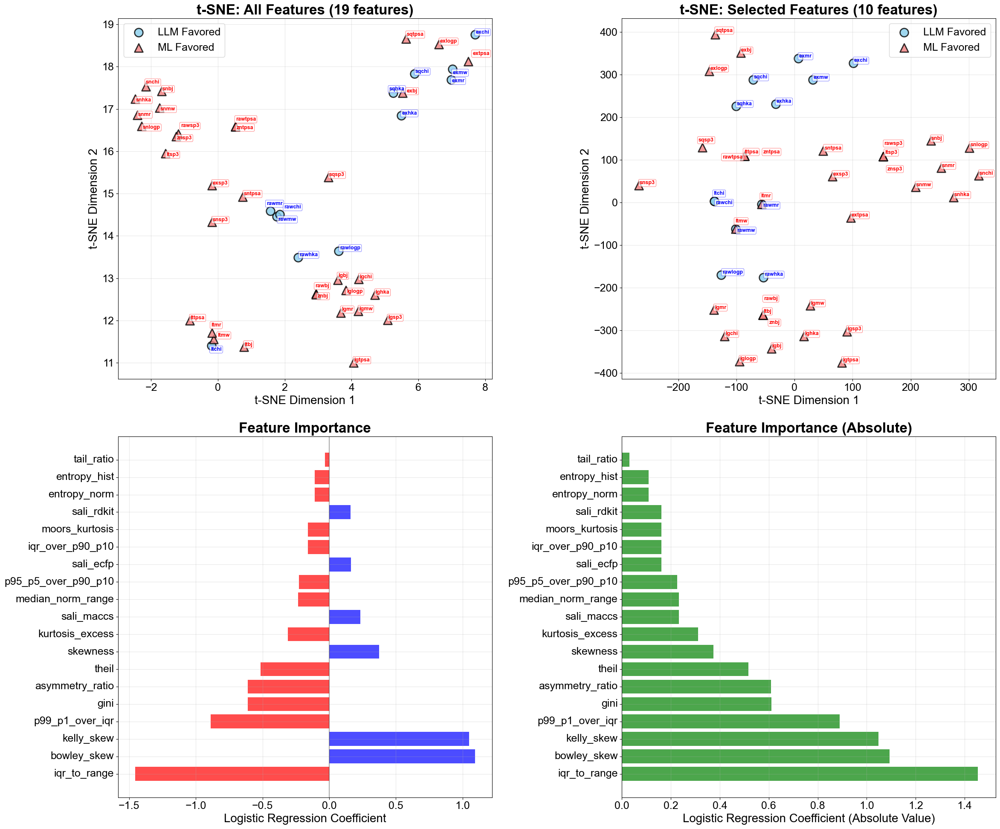

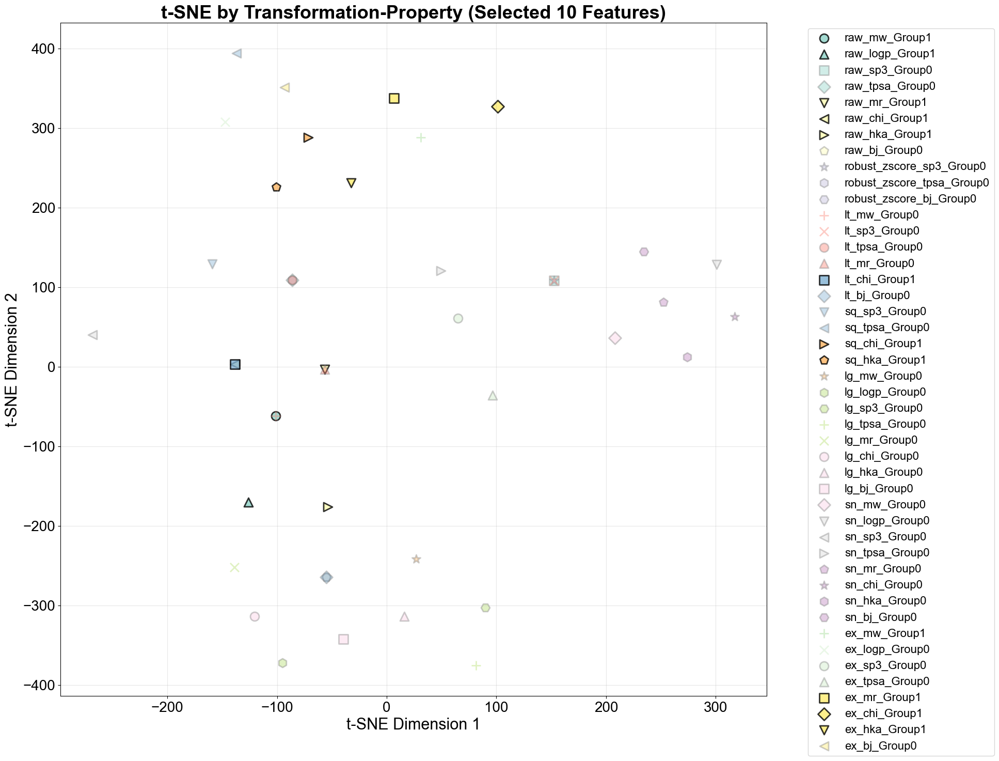


=== Logistic Regression with Selected 10 Features ===
CV Accuracy (Selected Features): 0.778 ± 0.099
CV Accuracy (All Features):      0.756 ± 0.083

=== Selected Features Classification Performance ===
              precision    recall  f1-score   support

           0       0.91      0.97      0.94        33
           1       0.90      0.75      0.82        12

    accuracy                           0.91        45
   macro avg       0.91      0.86      0.88        45
weighted avg       0.91      0.91      0.91        45


Feature importance saved: feature_importance_logistic.csv
t-SNE results saved: tsne_results_with_feature_selection.csv
Selected features saved: selected_features.csv

=== Analysis Complete ===
• Total number of features: 19
• Selected number of features: 10
• All features CV accuracy: 0.756
• Selected features CV accuracy: 0.778
• Unique transformation-property combinations: 45


In [216]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# 1) sali 통합 csv 읽기
sali_df = pd.read_csv("sali_mae_ratio_integrated.csv")

# 2) esol_col 매핑 함수
base_map = {
    "mw": "Molecular Weight",
    "logp": "LogP",
    "tpsa": "TPSA",
    "sp3": "sp3",
    "mr": "MolMR",
    "bj": "BJ",
    "chi": "Chi",
    "hka": "HKA",
}
suffix_map = {
    "raw": "",
    "robust_zscore": "_robust_zscore",
    "lt": "_lt",
    "sq": "_sq",
    "lg": "_lg",
    "sn": "_sn",
    "ex": "_ex",
}

random_state = 40

def esol_col_name(task, prop):
    base = base_map.get(str(prop).strip())
    suff = suffix_map.get(str(task).strip(), "")
    return f"{base}{suff}" if base else None

# 3) label 컬럼 안전하게 찾기: 'sali_avg' 다음 열을 label로 사용
if "sali_avg" not in sali_df.columns:
    raise ValueError("CSV에 'sali_avg' 열이 필요합니다.")
label_idx = sali_df.columns.get_loc("sali_avg") + 1
if label_idx >= len(sali_df.columns):
    raise ValueError("sali_avg 다음에 label(1/0/nan) 열이 필요합니다.")
label_col = sali_df.columns[label_idx]

# 4) esol_col 생성
sali_df["esol_col"] = sali_df.apply(lambda r: esol_col_name(r["task"], r["property"]), axis=1)

# 5) label 정리
def normalize_label(x):
    try:
        v = float(x)
    except Exception:
        return np.nan
    if np.isnan(v):
        return np.nan
    if v in (0.0, 1.0):
        return int(v)
    return np.nan

sali_df["label"] = sali_df[label_col].apply(normalize_label)
sali_df = sali_df.dropna(subset=["label"])
sali_df["label"] = sali_df["label"].astype(int)

# 6) 사용할 sali/메타 컬럼
sali_cols = [c for c in ["sali_ecfp","sali_rdkit","sali_maccs"] if c in sali_df.columns]

# 7) 확장 통계량 계산 함수 (분포 형태 지표 포함)
def compute_stats_extended(values: np.ndarray):
    x = np.asarray(values, dtype=float)
    x = x[np.isfinite(x)]
    n = len(x)
    if n == 0:
        return {k: np.nan for k in [
            "mean","median","std","mad","min","max",
            "q25","q75","iqr","q10","q90","q1","q5","q95","q99",
            "skewness","kurtosis_excess",
            "entropy_hist","entropy_norm",
            "asymmetry_ratio","tail_ratio","iqr_to_range","median_norm_range",
            "gini","theil",
            "bowley_skew","kelly_skew","moors_kurtosis",
            "p99_p1_over_iqr","p95_p5_over_p90_p10","iqr_over_p90_p10"
        ]}
    
    eps = 1e-12
    mean  = float(np.nanmean(x))
    median = float(np.nanmedian(x))
    std = float(np.nanstd(x, ddof=1)) if np.nanstd(x) > 0 else 0.0
    mad = float(np.nanmedian(np.abs(x - np.nanmedian(x))))
    xmin = float(np.nanmin(x))
    xmax = float(np.nanmax(x))
    q25 = float(np.nanpercentile(x, 25))
    q75 = float(np.nanpercentile(x, 75))
    iqr = float(q75 - q25)
    q10 = float(np.nanpercentile(x, 10))
    q90 = float(np.nanpercentile(x, 90))
    q1  = float(np.nanpercentile(x, 1))
    q5  = float(np.nanpercentile(x, 5))
    q95 = float(np.nanpercentile(x, 95))
    q99 = float(np.nanpercentile(x, 99))
    xrng = float(xmax - xmin)

    # Skewness & Kurtosis
    if std > 0:
        z = (x - mean) / std
        skewness = float(np.nanmean(z**3))
        kurtosis_excess = float(np.nanmean(z**4) - 3.0)
    else:
        skewness = 0.0
        kurtosis_excess = 0.0

    # Shannon Entropy
    hist, _ = np.histogram(x, bins=32, density=True)
    p = hist / (hist.sum() + eps)
    p = p[p > 0]
    entropy_hist = float(-np.sum(p * np.log(p + eps)))
    entropy_norm = float(entropy_hist / np.log(32))  # 정규화 엔트로피

    # 분위수 기반 skew/kurtosis
    bowley_skew = (q75 + q25 - 2*median) / (q75 - q25 + eps)
    kelly_skew = (q90 + q10 - 2*median) / (q90 - q10 + eps)
    moors_kurtosis = ((q75 - q25) + (q90 - q10)) / (q90 - q10 + eps)

    # --- 비율 지표 ---
    asymmetry_ratio = (q75 - median) / (median - q25 + eps)  # 좌우 비대칭
    tail_ratio = (q90 - q10) / (iqr + eps)                   # 꼬리 두께
    iqr_to_range = iqr / (xrng + eps)                        # 범위 대비 IQR
    median_norm_range = (xmax - xmin) / (abs(median) + eps)  # 중앙값 기반 정규화

    # --- 극단 분위수 지표 ---
    p99_p1_over_iqr = (q99 - q1) / (iqr + eps)
    p95_p5_over_p90_p10 = (q95 - q5) / (q90 - q10 + eps)
    iqr_over_p90_p10 = iqr / (q90 - q10 + eps)

    # 불평등 지표: Gini, Theil
    if n > 0:
        x_pos = x - np.min(x) + eps  # 음수 없게 shift
        x_sorted = np.sort(x_pos)
        cumx = np.cumsum(x_sorted)
        gini = 1 - 2 * np.sum(cumx) / (n * cumx[-1]) + (n + 1) / n
        p = x_pos / (np.sum(x_pos) + eps)
        theil = np.sum(p * np.log(p * n + eps))
    else:
        gini = np.nan
        theil = np.nan

    return {
        # "mean": mean,
        # "median": median,
        # "std": std,
        # "mad": mad,
        # "min": xmin,
        # "max": xmax,
        # "q25": q25,
        # "q75": q75,
        # "iqr": iqr,
        # "q10": q10,
        # "q90": q90,
        # "q1": q1,
        # "q5": q5,
        # "q95": q95,
        # "q99": q99,
        "skewness": skewness,
        "kurtosis_excess": kurtosis_excess,
        "entropy_hist": entropy_hist,
        "entropy_norm": entropy_norm,
        "asymmetry_ratio": asymmetry_ratio,
        "tail_ratio": tail_ratio,
        "iqr_to_range": iqr_to_range,
        "median_norm_range": median_norm_range,
        "gini": gini,
        "theil": theil,
        "bowley_skew": bowley_skew,
        "kelly_skew": kelly_skew,
        "moors_kurtosis": moors_kurtosis,
        "p99_p1_over_iqr": p99_p1_over_iqr,
        "p95_p5_over_p90_p10": p95_p5_over_p90_p10,
        "iqr_over_p90_p10": iqr_over_p90_p10,
    }

# 8) feature matrix 구축
rows = []
for _, r in sali_df.iterrows():
    col = r["esol_col"]
    if not col or col not in esol.columns:
        continue

    vals = esol[col].values
    feats = compute_stats_extended(vals)

    # sali 값들 추가
    for sc in sali_cols:
        feats[sc] = float(r[sc]) if pd.notna(r[sc]) else np.nan

    # 메타 & 라벨
    feats["label"] = int(r["label"])
    feats["task"] = r.get("task", "")
    feats["property"] = r.get("property", "")
    feats["taskprop_name"] = r.get("taskprop_name", "")
    feats["esol_col"] = col
    
    # transformation_property 생성 (task_property 형태)
    task_str = str(r.get("task", "")).strip()
    prop_str = str(r.get("property", "")).strip()
    feats["transformation_property"] = f"{task_str}_{prop_str}"
    
    rows.append(feats)

features = pd.DataFrame(rows)
if features.empty:
    raise RuntimeError("Features are empty. Please check esol column mapping or labels.")

print(f"Total samples: {len(features)}")
print(f"Label distribution: {features['label'].value_counts().to_dict()}")

# 9) 수치/메타 분리 및 결측치 처리
meta_cols = ["label","task","property","taskprop_name","esol_col","transformation_property"]
num_cols = [c for c in features.columns if c not in meta_cols]

X = features[num_cols].copy()
y = features["label"]

print(f"Number of features: {len(num_cols)}")

# 결측치 처리
for c in X.columns:
    med = np.nanmedian(X[c].to_numpy())
    if np.isnan(med):
        med = 0.0
    X[c] = X[c].fillna(med)

# 10) 표준화
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 11) 로지스틱 회귀로 feature importance 계산
print("\n=== Logistic Regression Model Training ===")
logistic = LogisticRegression(random_state=random_state, max_iter=1000)
logistic.fit(X_scaled, y)

# Cross-validation 점수 확인
cv_scores = cross_val_score(logistic, X_scaled, y, cv=5, scoring='accuracy')
print(f"CV Accuracy: {cv_scores.mean():.3f} ± {cv_scores.std():.3f}")

# 예측 및 성능 평가
y_pred = logistic.predict(X_scaled)
print("\n=== Classification Performance ===")
print(classification_report(y, y_pred))

# Feature importance (절댓값 기준)
feature_importance = pd.DataFrame({
    'feature': num_cols,
    'coefficient': logistic.coef_[0],
    'abs_coefficient': np.abs(logistic.coef_[0])
}).sort_values('abs_coefficient', ascending=False)

print("\n=== Top 20 Important Features ===")
print(feature_importance.head(20))

# 12) 상위 N개 feature 선택 (사용자 정의 가능)
top_n_features = int(input("Enter number of top features to select: "))
selected_features = feature_importance.head(top_n_features)['feature'].tolist()

print(f"\nSelected {top_n_features} features:")
for i, feat in enumerate(selected_features, 1):
    coef = feature_importance[feature_importance['feature'] == feat]['coefficient'].iloc[0]
    print(f"{i:2d}. {feat:25s} (coef: {coef:+.3f})")

# 13) 선택된 feature로 다시 t-SNE 수행
X_selected = X[selected_features]
X_selected_scaled = scaler.fit_transform(X_selected)

print(f"\n=== t-SNE with Selected {top_n_features} Features ===")
n_samples = X_selected_scaled.shape[0]
perplexity = max(5, min(30, n_samples // 3))

tsne_selected = TSNE(
    n_components=2,
    perplexity=perplexity,
    learning_rate="auto",
    init="pca",
    n_iter=1000,
    random_state=random_state,
    verbose=1
)
emb_selected = tsne_selected.fit_transform(X_selected_scaled)

# 14) 원본 t-SNE도 수행 (비교용)
print(f"\n=== t-SNE with All {len(num_cols)} Features ===")
tsne_all = TSNE(
    n_components=2,
    perplexity=perplexity,
    learning_rate="auto",
    init="pca",
    n_iter=10000,
    random_state=random_state,
    verbose=1
)
emb_all = tsne_all.fit_transform(X_scaled)

# 15) 결과를 DataFrame에 저장
features['tsne_all_x'] = emb_all[:, 0]
features['tsne_all_y'] = emb_all[:, 1]
features['tsne_selected_x'] = emb_selected[:, 0]
features['tsne_selected_y'] = emb_selected[:, 1]

# 16) 시각화 함수 정의 (transformation_property 어노테이션 포함)
# def plot_tsne_with_annotations(ax, x_col, y_col, title, features_df, fontsize=16):
#     """t-SNE plot with transformation_property annotations"""
#     mask1 = features_df["label"] == 1
#     mask0 = features_df["label"] == 0
    
#     # 점 그리기
#     scatter1 = ax.scatter(features_df.loc[mask1, x_col], features_df.loc[mask1, y_col], 
#                          marker="o", alpha=0.8, label="LLM Favored", s=200, c='skyblue', edgecolors='black', linewidths=2)
#     scatter0 = ax.scatter(features_df.loc[mask0, x_col], features_df.loc[mask0, y_col], 
#                          marker="^", alpha=0.8, label="ML Favored", s=200, c='lightcoral', edgecolors='black', linewidths=2)
    
#     # # transformation_property 어노테이션 추가
#     # for idx, row in features_df.iterrows():
#     #     ax.annotate(row['transformation_property'], 
#     #                (row[x_col], row[y_col]),
#     #                xytext=(10, 10), textcoords='offset points',
#     #                fontsize=fontsize, alpha=0.9, fontweight='bold',
#     #                bbox=dict(boxstyle='round,pad=0.4', facecolor='white', alpha=0.9, edgecolor='gray', linewidth=1))
    
#     ax.set_title(title, fontsize=24, fontweight='bold')
#     ax.set_xlabel("t-SNE Dimension 1", fontsize=20)
#     ax.set_ylabel("t-SNE Dimension 2", fontsize=20)
#     ax.legend(fontsize=18)
#     ax.grid(True, alpha=0.3)
#     ax.tick_params(axis='both', which='major', labelsize=18)

def plot_tsne_with_annotations(ax, x_col, y_col, title, features_df, fontsize=9):
   """t-SNE plot with transformation_property annotations"""
   mask1 = features_df["label"] == 1
   mask0 = features_df["label"] == 0
   
   # 점 그리기
   scatter1 = ax.scatter(features_df.loc[mask1, x_col], features_df.loc[mask1, y_col], 
                        marker="o", alpha=0.8, label="LLM Favored", s=200, c='skyblue', edgecolors='black', linewidths=2)
   scatter0 = ax.scatter(features_df.loc[mask0, x_col], features_df.loc[mask0, y_col], 
                        marker="^", alpha=0.8, label="ML Favored", s=200, c='lightcoral', edgecolors='black', linewidths=2)
   
   # 텍스트 객체들을 저장할 리스트
   texts = []
   
   # 각 점에 대한 라벨 생성
   for idx, row in features_df.iterrows():
       # 원본 라벨에서 'robust_zscore'를 'zn'으로 바꾸고 '_' 제거
       label_text = row['transformation_property'].replace('robust_zscore', 'zn').replace('_', '')
       color = 'blue' if row['label'] == 1 else 'red'
       
       txt = ax.text(row[x_col], row[y_col], label_text,
                    fontsize=fontsize, fontweight='bold', color=color,
                    bbox=dict(boxstyle='round,pad=0.2', 
                             facecolor='white', alpha=0.7,
                             edgecolor=color, linewidth=0.5))
       texts.append(txt)
   
   # adjustText로 라벨 위치 자동 조정
   adjust_text(texts,
               ax=ax,
               force_text=0.8,
               force_points=0.2,
               autoalign='xy',      # 자동 정렬
               ha='center',         # 수평 정렬
               va='center')         # 수직 정렬
   
   ax.set_title(title, fontsize=24, fontweight='bold')
   ax.set_xlabel("t-SNE Dimension 1", fontsize=20)
   ax.set_ylabel("t-SNE Dimension 2", fontsize=20)
   ax.legend(fontsize=18)
   ax.grid(True, alpha=0.3)
   ax.tick_params(axis='both', which='major', labelsize=18)

# 17) 시각화 (2x2 subplot)
fig, axes = plt.subplots(2, 2, figsize=(24, 20))

# 원본 t-SNE (어노테이션 포함)
plot_tsne_with_annotations(axes[0, 0], "tsne_all_x", "tsne_all_y", 
                          f"t-SNE: All Features ({len(num_cols)} features)", features)

# 선택된 feature t-SNE (어노테이션 포함)
plot_tsne_with_annotations(axes[0, 1], "tsne_selected_x", "tsne_selected_y", 
                          f"t-SNE: Selected Features ({top_n_features} features)", features)

# Feature importance 막대 그래프
top = 19
top_15 = feature_importance.head(top)
colors = ['red' if coef < 0 else 'blue' for coef in top_15['coefficient']]
axes[1, 0].barh(range(len(top_15)), top_15['coefficient'], color=colors, alpha=0.7)
axes[1, 0].set_yticks(range(len(top_15)))
axes[1, 0].set_yticklabels(top_15['feature'], fontsize=18, rotation = 0, ha = 'right', va = 'center')
axes[1, 0].set_xlabel('Logistic Regression Coefficient', fontsize=20)
axes[1, 0].set_title(f'Feature Importance', fontsize=24, fontweight='bold')
axes[1, 0].axvline(x=0, color='black', linestyle='-', alpha=0.3)
axes[1, 0].grid(True, alpha=0.3)
axes[1, 0].tick_params(axis='both', which='major', labelsize=18)

# Feature importance 절댓값 막대 그래프
axes[1, 1].barh(range(len(top_15)), top_15['abs_coefficient'], alpha=0.7, color='green')
axes[1, 1].set_yticks(range(len(top_15)))
axes[1, 1].set_yticklabels(top_15['feature'], fontsize=18, rotation = 0, ha = 'right', va = 'center')
axes[1, 1].set_xlabel('Logistic Regression Coefficient (Absolute Value)', fontsize=20)
axes[1, 1].set_title(f'Feature Importance (Absolute)', fontsize=24, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3)
axes[1, 1].tick_params(axis='both', which='major', labelsize=18)

plt.tight_layout()
plt.show()

# 18) 추가 시각화: transformation_property별 분포
fig, ax = plt.subplots(1, 1, figsize=(20, 16))

# 각 transformation_property별로 다른 색상과 마커 사용
unique_props = features['transformation_property'].unique()
colors = plt.cm.Set3(np.linspace(0, 1, len(unique_props)))
markers = ['o', '^', 's', 'D', 'v', '<', '>', 'p', '*', 'h', 'H', '+', 'x']

for i, prop in enumerate(unique_props):
    mask = features['transformation_property'] == prop
    subset = features[mask]
    
    marker = markers[i % len(markers)]
    color = colors[i]
    
    # Group 1
    mask1 = subset['label'] == 1
    if mask1.any():
        ax.scatter(subset.loc[mask1, 'tsne_selected_x'], subset.loc[mask1, 'tsne_selected_y'],
                  marker=marker, c=[color], s=150, alpha=0.8, 
                  label=f'{prop}_Group1', edgecolors='black', linewidth=2)
    
    # Group 0
    mask0 = subset['label'] == 0
    if mask0.any():
        ax.scatter(subset.loc[mask0, 'tsne_selected_x'], subset.loc[mask0, 'tsne_selected_y'],
                  marker=marker, c=[color], s=150, alpha=0.4, 
                  label=f'{prop}_Group0', edgecolors='gray', linewidth=2)

ax.set_title(f't-SNE by Transformation-Property (Selected {top_n_features} Features)', 
             fontsize=26, fontweight='bold')
ax.set_xlabel('t-SNE Dimension 1', fontsize=22)
ax.set_ylabel('t-SNE Dimension 2', fontsize=22)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=16)
ax.grid(True, alpha=0.3)
ax.tick_params(axis='both', which='major', labelsize=20)
plt.tight_layout()
plt.show()

# 19) 선택된 feature로 다시 로지스틱 회귀 성능 확인
print(f"\n=== Logistic Regression with Selected {top_n_features} Features ===")
logistic_selected = LogisticRegression(random_state=random_state, max_iter=1000)
logistic_selected.fit(X_selected_scaled, y)

cv_scores_selected = cross_val_score(logistic_selected, X_selected_scaled, y, cv=5, scoring='accuracy')
print(f"CV Accuracy (Selected Features): {cv_scores_selected.mean():.3f} ± {cv_scores_selected.std():.3f}")
print(f"CV Accuracy (All Features):      {cv_scores.mean():.3f} ± {cv_scores.std():.3f}")

y_pred_selected = logistic_selected.predict(X_selected_scaled)
print("\n=== Selected Features Classification Performance ===")
print(classification_report(y, y_pred_selected))

# 20) 결과 저장
# Feature importance 저장
feature_importance.to_csv("feature_importance_logistic.csv", index=False)
print(f"\nFeature importance saved: feature_importance_logistic.csv")

# t-SNE 결과 저장
features.to_csv("tsne_results_with_feature_selection.csv", index=False)
print(f"t-SNE results saved: tsne_results_with_feature_selection.csv")

# 선택된 feature 목록 저장
selected_features_df = pd.DataFrame({
    'rank': range(1, len(selected_features) + 1),
    'feature': selected_features,
    'coefficient': [feature_importance[feature_importance['feature'] == f]['coefficient'].iloc[0] 
                   for f in selected_features],
    'abs_coefficient': [feature_importance[feature_importance['feature'] == f]['abs_coefficient'].iloc[0] 
                       for f in selected_features]
})
selected_features_df.to_csv("selected_features.csv", index=False)
print(f"Selected features saved: selected_features.csv")

print("\n=== Analysis Complete ===")
print(f"• Total number of features: {len(num_cols)}")
print(f"• Selected number of features: {top_n_features}")
print(f"• All features CV accuracy: {cv_scores.mean():.3f}")
print(f"• Selected features CV accuracy: {cv_scores_selected.mean():.3f}")
print(f"• Unique transformation-property combinations: {len(unique_props)}")

9 [ 0.32504457 -0.37657785]
13 [0.04013604 0.09342056]


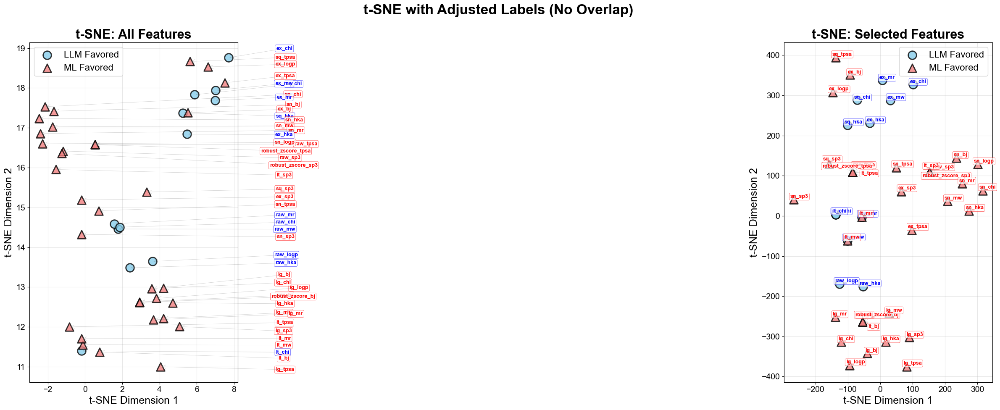

In [172]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import FancyBboxPatch
import warnings
warnings.filterwarnings('ignore')

# 방법 1: adjustText 라이브러리 사용 (설치 필요: pip install adjustText)
try:
    from adjustText import adjust_text
    ADJUST_TEXT_AVAILABLE = True
except ImportError:
    ADJUST_TEXT_AVAILABLE = False
    print("adjustText not installed. Using alternative methods.")
    print("Install with: pip install adjustText")

# 방법 1: adjustText를 사용한 자동 라벨 조정
def plot_tsne_with_adjusted_labels(ax, x_col, y_col, title, features_df):
    """adjustText를 사용하여 라벨 겹침 자동 조정"""
    if not ADJUST_TEXT_AVAILABLE:
        print("adjustText not available. Skipping this visualization.")
        return
    
    mask1 = features_df["label"] == 1
    mask0 = features_df["label"] == 0
    
    # 점 그리기
    ax.scatter(features_df.loc[mask1, x_col], features_df.loc[mask1, y_col], 
               marker="o", alpha=0.8, label="LLM Favored", 
               s=200, c='skyblue', edgecolors='black', linewidths=2, zorder=2)
    
    ax.scatter(features_df.loc[mask0, x_col], features_df.loc[mask0, y_col], 
               marker="^", alpha=0.8, label="ML Favored", 
               s=200, c='lightcoral', edgecolors='black', linewidths=2, zorder=2)
    
    # 텍스트 객체들을 저장할 리스트
    texts = []
    
    # 각 점에 대한 라벨 생성
    for idx, row in features_df.iterrows():
        label_text = row['transformation_property']
        color = 'blue' if row['label'] == 1 else 'red'
        
        txt = ax.text(row[x_col], row[y_col], label_text,
                     fontsize=9, fontweight='bold', color=color,
                     bbox=dict(boxstyle='round,pad=0.2', 
                              facecolor='white', alpha=0.7,
                              edgecolor=color, linewidth=0.5))
        texts.append(txt)
    
    # adjustText로 라벨 위치 자동 조정
    adjust_text(texts, 
                x=features_df[x_col].values, 
                y=features_df[y_col].values,
                arrowprops=dict(arrowstyle='->', color='gray', alpha=0.4, lw=0.5),
                force_text=(0.5, 0.5),
                expand_text=(1.2, 1.2),
                expand_points=(1.2, 1.2))
    
    ax.set_title(title, fontsize=22, fontweight='bold')
    ax.set_xlabel("t-SNE Dimension 1", fontsize=18)
    ax.set_ylabel("t-SNE Dimension 2", fontsize=18)
    ax.legend(fontsize=16, loc='best')
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='both', which='major', labelsize=14)

# 방법 2: 선택적 라벨 표시 (밀도가 낮은 지역의 점만 라벨 표시)
def plot_tsne_selective_labels(ax, x_col, y_col, title, features_df, min_distance=5):
    """거리가 충분히 떨어진 점들만 라벨 표시"""
    mask1 = features_df["label"] == 1
    mask0 = features_df["label"] == 0
    
    # 점 그리기
    ax.scatter(features_df.loc[mask1, x_col], features_df.loc[mask1, y_col], 
               marker="o", alpha=0.8, label="LLM Favored", 
               s=200, c='skyblue', edgecolors='black', linewidths=2)
    
    ax.scatter(features_df.loc[mask0, x_col], features_df.loc[mask0, y_col], 
               marker="^", alpha=0.8, label="ML Favored", 
               s=200, c='lightcoral', edgecolors='black', linewidths=2)
    
    # 라벨을 표시할 점 선택 (서로 충분히 떨어진 점들만)
    labeled_points = []
    
    for idx, row in features_df.iterrows():
        x, y = row[x_col], row[y_col]
        
        # 이미 라벨이 표시된 점들과의 거리 확인
        too_close = False
        for lx, ly in labeled_points:
            dist = np.sqrt((x - lx)**2 + (y - ly)**2)
            if dist < min_distance:
                too_close = True
                break
        
        if not too_close:
            labeled_points.append((x, y))
            label_text = row['transformation_property']
            color = 'blue' if row['label'] == 1 else 'red'
            
            ax.annotate(label_text, 
                       xy=(x, y),
                       xytext=(10, 10),
                       textcoords='offset points',
                       fontsize=9, fontweight='bold',
                       color=color,
                       bbox=dict(boxstyle='round,pad=0.3', 
                                facecolor='white', alpha=0.8,
                                edgecolor=color, linewidth=0.5),
                       arrowprops=dict(arrowstyle='->', 
                                      connectionstyle='arc3,rad=0.3',
                                      color=color, alpha=0.5, lw=0.5))
    
    ax.set_title(title, fontsize=22, fontweight='bold')
    ax.set_xlabel("t-SNE Dimension 1", fontsize=18)
    ax.set_ylabel("t-SNE Dimension 2", fontsize=18)
    ax.legend(fontsize=16, loc='best')
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='both', which='major', labelsize=14)

# 방법 3: 번호 표시 + 범례
def plot_tsne_with_numbers(ax, x_col, y_col, title, features_df):
    """점에는 번호만 표시하고, 별도 범례에 번호-라벨 매핑 표시"""
    mask1 = features_df["label"] == 1
    mask0 = features_df["label"] == 0
    
    # 점 그리기
    ax.scatter(features_df.loc[mask1, x_col], features_df.loc[mask1, y_col], 
               marker="o", alpha=0.8, label="LLM Favored", 
               s=200, c='skyblue', edgecolors='black', linewidths=2)
    
    ax.scatter(features_df.loc[mask0, x_col], features_df.loc[mask0, y_col], 
               marker="^", alpha=0.8, label="ML Favored", 
               s=200, c='lightcoral', edgecolors='black', linewidths=2)
    
    # 각 점에 번호 표시
    legend_text = []
    for idx, (_, row) in enumerate(features_df.iterrows()):
        num = idx + 1
        color = 'blue' if row['label'] == 1 else 'red'
        
        ax.text(row[x_col], row[y_col], str(num),
               fontsize=10, fontweight='bold',
               ha='center', va='center',
               color='white',
               bbox=dict(boxstyle='circle,pad=0.3', 
                        facecolor=color, alpha=0.8))
        
        # 범례용 텍스트 저장
        legend_text.append(f"{num}: {row['transformation_property']}")
    
    ax.set_title(title, fontsize=22, fontweight='bold')
    ax.set_xlabel("t-SNE Dimension 1", fontsize=18)
    ax.set_ylabel("t-SNE Dimension 2", fontsize=18)
    ax.legend(fontsize=16, loc='best')
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='both', which='major', labelsize=14)
    
    # 번호-라벨 매핑을 텍스트로 반환
    return legend_text

# 방법 4: 호버 효과를 위한 인터랙티브 플롯 (matplotlib interactive)
def plot_tsne_interactive(x_col, y_col, title, features_df):
    """마우스 호버시 라벨 표시 (Jupyter notebook에서 %matplotlib widget 필요)"""
    fig, ax = plt.subplots(figsize=(12, 10))
    
    mask1 = features_df["label"] == 1
    mask0 = features_df["label"] == 0
    
    # 점 그리기
    scatter1 = ax.scatter(features_df.loc[mask1, x_col], features_df.loc[mask1, y_col], 
                         marker="o", alpha=0.8, label="LLM Favored", 
                         s=200, c='skyblue', edgecolors='black', linewidths=2)
    
    scatter2 = ax.scatter(features_df.loc[mask0, x_col], features_df.loc[mask0, y_col], 
                         marker="^", alpha=0.8, label="ML Favored", 
                         s=200, c='lightcoral', edgecolors='black', linewidths=2)
    
    # 주석 객체 생성 (초기에는 숨김)
    annot = ax.annotate("", xy=(0,0), xytext=(10,10), textcoords="offset points",
                       bbox=dict(boxstyle="round", fc="yellow", alpha=0.9),
                       arrowprops=dict(arrowstyle="->"))
    annot.set_visible(False)
    
    def update_annot(ind, scatter, df_subset):
        """호버시 주석 업데이트"""
        pos = scatter.get_offsets()[ind["ind"][0]]
        annot.xy = pos
        
        # 해당 점의 정보 가져오기
        idx = ind["ind"][0]
        row = df_subset.iloc[idx]
        text = f"{row['transformation_property']}\nLabel: {row['label']}"
        
        annot.set_text(text)
        annot.get_bbox_patch().set_facecolor('yellow' if row['label'] == 1 else 'pink')
        annot.get_bbox_patch().set_alpha(0.9)
    
    def hover(event):
        """마우스 호버 이벤트 처리"""
        vis = annot.get_visible()
        if event.inaxes == ax:
            # scatter1 체크
            cont1, ind1 = scatter1.contains(event)
            if cont1:
                update_annot(ind1, scatter1, features_df[mask1])
                annot.set_visible(True)
                fig.canvas.draw_idle()
                return
            
            # scatter2 체크
            cont2, ind2 = scatter2.contains(event)
            if cont2:
                update_annot(ind2, scatter2, features_df[mask0])
                annot.set_visible(True)
                fig.canvas.draw_idle()
                return
            
            # 호버 벗어남
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()
    
    fig.canvas.mpl_connect("motion_notify_event", hover)
    
    ax.set_title(title, fontsize=22, fontweight='bold')
    ax.set_xlabel("t-SNE Dimension 1", fontsize=18)
    ax.set_ylabel("t-SNE Dimension 2", fontsize=18)
    ax.legend(fontsize=16, loc='best')
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='both', which='major', labelsize=14)
    
    return fig, ax

# ===== 메인 실행 코드 =====

# 옵션 1: adjustText 사용 (가장 추천)
if ADJUST_TEXT_AVAILABLE:
    fig1, axes1 = plt.subplots(1, 2, figsize=(24, 10))
    plot_tsne_with_adjusted_labels(axes1[0], "tsne_all_x", "tsne_all_y", 
                                   f"t-SNE: All Features", features)
    plot_tsne_with_adjusted_labels(axes1[1], "tsne_selected_x", "tsne_selected_y", 
                                   f"t-SNE: Selected Features", features)
    plt.suptitle("t-SNE with Adjusted Labels (No Overlap)", fontsize=24, fontweight='bold')
    plt.tight_layout()
    plt.show()

# # 옵션 2: 선택적 라벨 표시
# fig2, axes2 = plt.subplots(1, 2, figsize=(24, 10))
# plot_tsne_selective_labels(axes2[0], "tsne_all_x", "tsne_all_y", 
#                            f"t-SNE: All Features", features, min_distance=8)
# plot_tsne_selective_labels(axes2[1], "tsne_selected_x", "tsne_selected_y", 
#                            f"t-SNE: Selected Features", features, min_distance=8)
# plt.suptitle("t-SNE with Selective Labels (Sparse)", fontsize=24, fontweight='bold')
# plt.tight_layout()
# plt.show()

# # 옵션 3: 번호 표시 + 범례
# fig3, axes3 = plt.subplots(1, 2, figsize=(28, 10))
# legend1 = plot_tsne_with_numbers(axes3[0], "tsne_all_x", "tsne_all_y", 
#                                  f"t-SNE: All Features", features)
# legend2 = plot_tsne_with_numbers(axes3[1], "tsne_selected_x", "tsne_selected_y", 
#                                  f"t-SNE: Selected Features", features)

# plt.suptitle("t-SNE with Numbered Points", fontsize=24, fontweight='bold')
# plt.tight_layout()
# plt.show()

# # 번호-라벨 매핑 출력
# print("\n=== Point Number Mapping ===")
# print("\nAll Features t-SNE:")
# for item in legend1:
#     print(item)
# print("\nSelected Features t-SNE:")
# for item in legend2:
#     print(item)

# # 옵션 4: 인터랙티브 플롯 (Jupyter Notebook에서 사용)
# # Jupyter에서는 먼저 %matplotlib widget 실행 필요
# print("\n=== Interactive Plot ===")
# print("For Jupyter Notebook, run: %matplotlib widget")
# fig_int1, ax_int1 = plot_tsne_interactive("tsne_all_x", "tsne_all_y", 
#                                           "t-SNE: All Features (Hover for labels)", features)
# plt.show()

# fig_int2, ax_int2 = plot_tsne_interactive("tsne_selected_x", "tsne_selected_y", 
#                                           "t-SNE: Selected Features (Hover for labels)", features)
# plt.show()

# # 옵션 5: 줄임말 사용 + 화살표
# def plot_tsne_abbreviated_arrows(ax, x_col, y_col, title, features_df):
#     """약어 + 화살표로 라벨 표시"""
#     mask1 = features_df["label"] == 1
#     mask0 = features_df["label"] == 0
    
#     # 점 그리기
#     ax.scatter(features_df.loc[mask1, x_col], features_df.loc[mask1, y_col], 
#                marker="o", alpha=0.8, label="LLM Favored", 
#                s=200, c='skyblue', edgecolors='black', linewidths=2, zorder=3)
    
#     ax.scatter(features_df.loc[mask0, x_col], features_df.loc[mask0, y_col], 
#                marker="^", alpha=0.8, label="ML Favored", 
#                s=200, c='lightcoral', edgecolors='black', linewidths=2, zorder=3)
    
#     # 각 점에 대해 화살표와 라벨 추가
#     np.random.seed(42)  # 재현 가능한 랜덤 각도
#     for idx, row in features_df.iterrows():
#         # 약어 생성
#         parts = row['transformation_property'].split('_')
#         if len(parts) >= 2:
#             abbrev = f"{parts[0][:3]}_{parts[1][:4]}"
#         else:
#             abbrev = row['transformation_property'][:7]
        
#         # 랜덤 각도로 화살표 방향 설정 (겹침 방지)
#         angle = np.random.uniform(0, 2*np.pi)
#         offset_x = 15 * np.cos(angle)
#         offset_y = 15 * np.sin(angle)
        
#         color = 'darkblue' if row['label'] == 1 else 'darkred'
        
#         ax.annotate(abbrev,
#                    xy=(row[x_col], row[y_col]),
#                    xytext=(offset_x, offset_y),
#                    textcoords='offset points',
#                    fontsize=8, fontweight='bold',
#                    color=color,
#                    ha='center', va='center',
#                    bbox=dict(boxstyle='round,pad=0.2',
#                             facecolor='white', alpha=0.8,
#                             edgecolor=color, linewidth=0.5),
#                    arrowprops=dict(arrowstyle='-',
#                                   color=color, alpha=0.3, lw=0.8))
    
#     ax.set_title(title, fontsize=22, fontweight='bold')
#     ax.set_xlabel("t-SNE Dimension 1", fontsize=18)
#     ax.set_ylabel("t-SNE Dimension 2", fontsize=18)
#     ax.legend(fontsize=16, loc='best')
#     ax.grid(True, alpha=0.3)
#     ax.tick_params(axis='both', which='major', labelsize=14)

# # 옵션 5 실행
# fig5, axes5 = plt.subplots(1, 2, figsize=(24, 10))
# plot_tsne_abbreviated_arrows(axes5[0], "tsne_all_x", "tsne_all_y", 
#                             f"t-SNE: All Features", features)
# plot_tsne_abbreviated_arrows(axes5[1], "tsne_selected_x", "tsne_selected_y", 
#                             f"t-SNE: Selected Features", features)
# plt.suptitle("t-SNE with Abbreviated Labels & Arrows", fontsize=24, fontweight='bold')
# plt.tight_layout()
# plt.show()

adjustText loaded successfully!


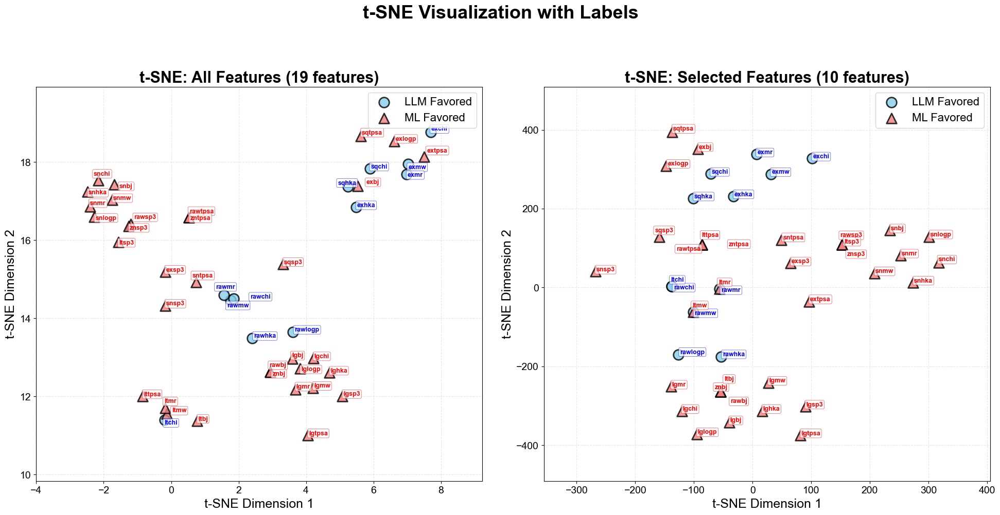


=== Point Information ===
Transformation-Property   | Label      | All-tSNE (x,y)       | Selected-tSNE (x,y) 
------------------------------------------------------------------------------------------
raw_mw                    | LLM        | (   1.77,   14.46) | (-101.41,  -62.05)
raw_logp                  | LLM        | (   3.62,   13.64) | (-126.42, -169.95)
raw_sp3                   | ML         | (  -1.19,   16.42) | ( 152.39,  108.20)
raw_tpsa                  | ML         | (   0.52,   16.58) | ( -86.00,  108.87)
raw_mr                    | LLM        | (   1.57,   14.59) | ( -56.71,   -3.47)
raw_chi                   | LLM        | (   1.86,   14.51) | (-138.23,    2.95)
raw_hka                   | LLM        | (   2.41,   13.49) | ( -53.50, -175.74)
raw_bj                    | ML         | (   2.93,   12.63) | ( -54.95, -264.11)
robust_zscore_sp3         | ML         | (  -1.26,   16.35) | ( 152.39,  108.20)
robust_zscore_tpsa        | ML         | (   0.52,   16.58) | ( -86.

In [204]:
import matplotlib.pyplot as plt
import numpy as np

# adjustText 라이브러리 import (설치 필요: pip install adjustText)
try:
    from adjustText import adjust_text
    print("adjustText loaded successfully!")
except ImportError:
    print("ERROR: adjustText not installed!")
    print("Please install with: pip install adjustText")
    raise
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 25

# adjustText를 사용한 자동 라벨 조정 함수
def plot_tsne_with_adjusted_labels(ax, x_col, y_col, title, features_df):
    """adjustText를 사용하여 라벨 겹침 자동 조정"""
    
    mask1 = features_df["label"] == 1
    mask0 = features_df["label"] == 0
    
    # 점 그리기 - 동일한 스타일 적용
    ax.scatter(features_df.loc[mask1, x_col], features_df.loc[mask1, y_col], 
               marker="o", alpha=0.8, label="LLM Favored", 
               s=200, c='skyblue', edgecolors='black', linewidths=2, zorder=2)
    
    ax.scatter(features_df.loc[mask0, x_col], features_df.loc[mask0, y_col], 
               marker="^", alpha=0.8, label="ML Favored", 
               s=200, c='lightcoral', edgecolors='black', linewidths=2, zorder=2)
    
    # 텍스트 객체들을 저장할 리스트
    texts = []
    
    # 각 점에 대한 라벨 생성
    for idx, row in features_df.iterrows():
        # 원본 라벨에서 'robust_zscore'를 'zn'으로 바꾸고 '_' 제거
        label_text = row['transformation_property'].replace('robust_zscore', 'zn').replace('_', '')
        color = 'blue' if row['label'] == 1 else 'red'
        
        txt = ax.text(row[x_col], row[y_col], label_text,
                    fontsize=9, fontweight='bold', color=color,
                    bbox=dict(boxstyle='round,pad=0.2', 
                            facecolor='white', alpha=0.7,
                            edgecolor=color, linewidth=0.5))
        texts.append(txt)
    
    # adjustText로 라벨 위치 자동 조정
    # adjust_text(texts,
    #         ax=ax,  # 이게 핵심!
    #         force_text=0.2,
    #         force_points=0.5,
    #         lim=500)  # 반복 횟수 제한해서 너무 멀리 안 가게
    adjust_text(texts,
            ax=ax,
            force_text=0.8,
            force_points=0.2,
            autoalign='xy',      # 자동 정렬
            ha='center',         # 수평 정렬
            va='center')         # 수직 정렬
    
    # 그래프 스타일 설정 - 두 그래프 동일하게
    ax.set_title(title, fontsize=22, fontweight='bold')
    ax.set_xlabel("t-SNE Dimension 1", fontsize=18)
    ax.set_ylabel("t-SNE Dimension 2", fontsize=18)
    ax.legend(fontsize=16, loc='best')
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.tick_params(axis='both', which='major', labelsize=14)
    
    # 축 범위 약간 확장 (라벨이 잘리지 않도록)
    x_margin = (features_df[x_col].max() - features_df[x_col].min()) * 0.15
    y_margin = (features_df[y_col].max() - features_df[y_col].min()) * 0.15
    ax.set_xlim(features_df[x_col].min() - x_margin, features_df[x_col].max() + x_margin)
    ax.set_ylim(features_df[y_col].min() - y_margin, features_df[y_col].max() + y_margin)

# 메인 실행 코드
fig, axes = plt.subplots(1,2, figsize=(20, 10))

# 1. 전체 features t-SNE
plot_tsne_with_adjusted_labels(
    axes[0], 
    "tsne_all_x", "tsne_all_y", 
    f"t-SNE: All Features ({len(num_cols)} features)", 
    features
)

# 2. 선택된 features t-SNE
plot_tsne_with_adjusted_labels(
    axes[1], 
    "tsne_selected_x", "tsne_selected_y", 
    f"t-SNE: Selected Features ({top_n_features} features)", 
    features
)

# 전체 제목
plt.suptitle("t-SNE Visualization with Labels", 
             fontsize=26, fontweight='bold', y=1.02)

plt.tight_layout()
plt.show()

# 각 점의 정보 출력 (확인용)
print("\n=== Point Information ===")
print(f"{'Transformation-Property':<25} | {'Label':<10} | {'All-tSNE (x,y)':<20} | {'Selected-tSNE (x,y)':<20}")
print("-" * 90)
for idx, row in features.iterrows():
    print(f"{row['transformation_property']:<25} | "
          f"{'LLM' if row['label']==1 else 'ML':<10} | "
          f"({row['tsne_all_x']:>7.2f}, {row['tsne_all_y']:>7.2f}) | "
          f"({row['tsne_selected_x']:>7.2f}, {row['tsne_selected_y']:>7.2f})")

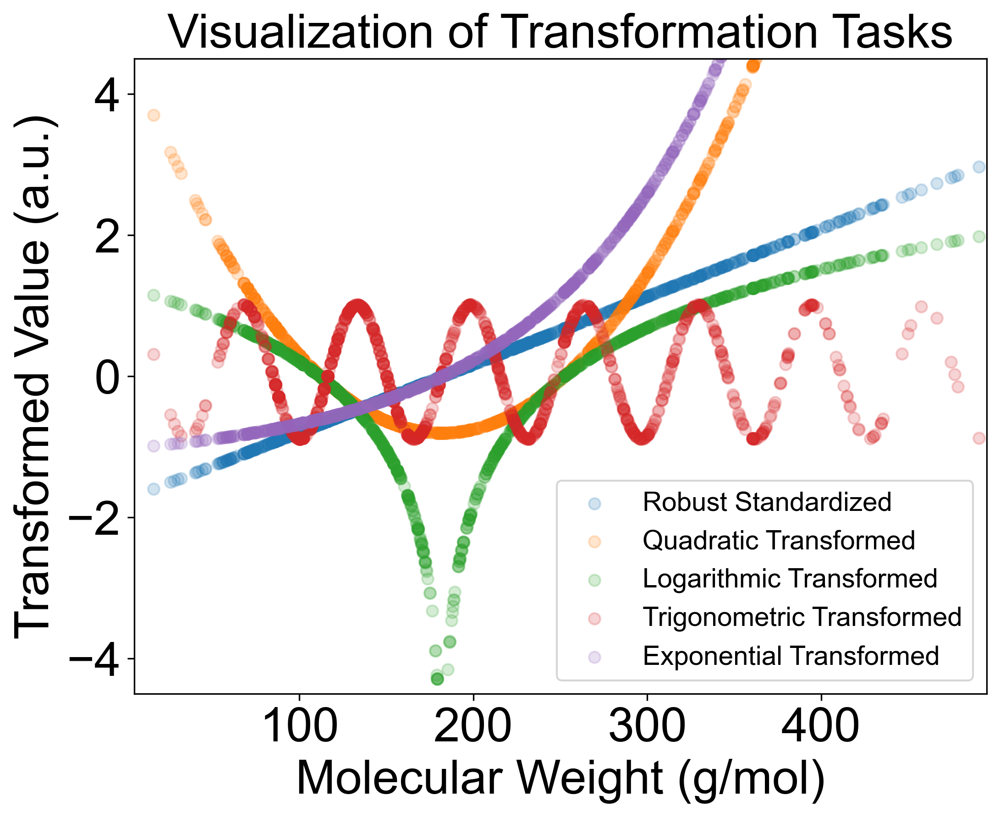

In [35]:
# plt.hist(esol['Molecular Weight_sn'], bins=50, alpha=0.7, color='green', edgecolor='black')

prop = 'Molecular Weight'  # 예시로 'Molecular Weight' 사용
plt.figure(figsize=(8, 6), dpi=300)
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 25
x = esol['Molecular Weight']
plt.scatter(x, esol[f'{prop}_robust_zscore'], alpha=0.2, c = 'C0', label='Robust Standardized')
# plt.scatter(esol[f'{prop}_robust_zscore'], esol[f'{prop}_lt'], alpha=0.2, c = 'C1', label='Scaled Robust Standardized')
plt.scatter(x, esol[f'{prop}_sq'], alpha=0.2, c = 'C1', label='Quadratic Transformed')
plt.scatter(x, esol[f'{prop}_lg'], alpha=0.2, c = 'C2', label='Logarithmic Transformed')
plt.scatter(x, esol[f'{prop}_sn'], alpha=0.2, c = 'C3', label='Trigonometric Transformed')
plt.scatter(x, esol[f'{prop}_ex'], alpha=0.2, c = 'C4', label='Exponential Transformed')
plt.title('Visualization of Transformation Tasks', fontsize = 25)
plt.ylim(-4.5, 4.5)
plt.xlim(5, 495)
plt.xlabel('Molecular Weight (g/mol)')
plt.ylabel("Transformed Value (a.u.)")
plt.legend(fontsize = 14)
plt.show()

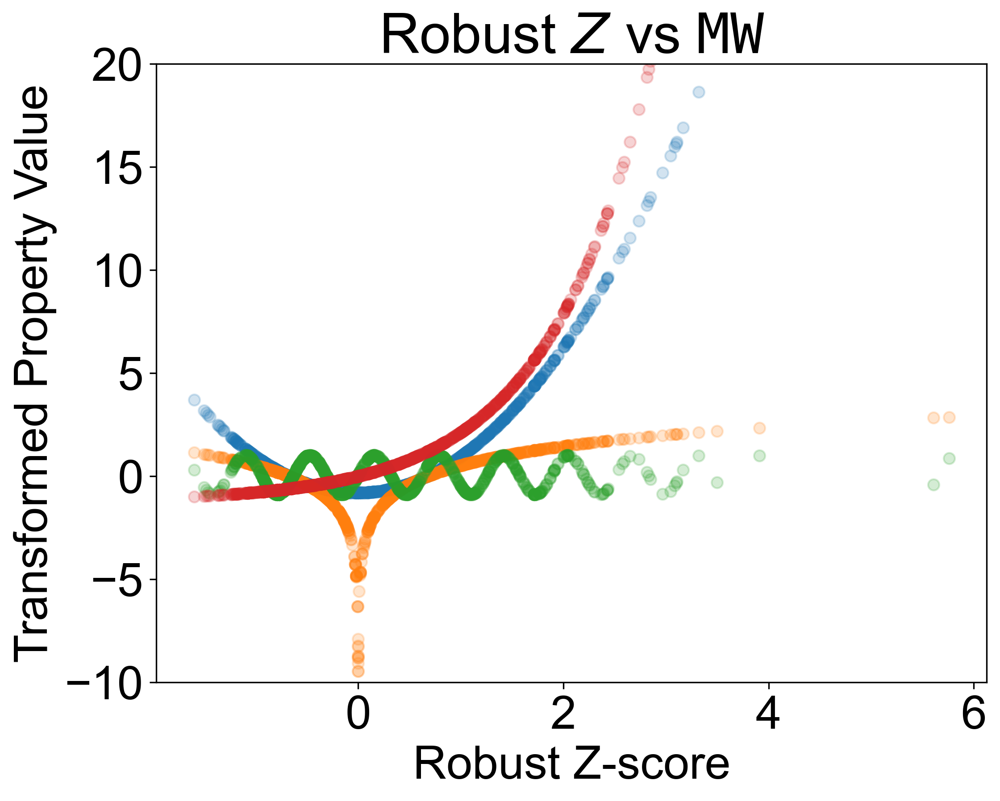

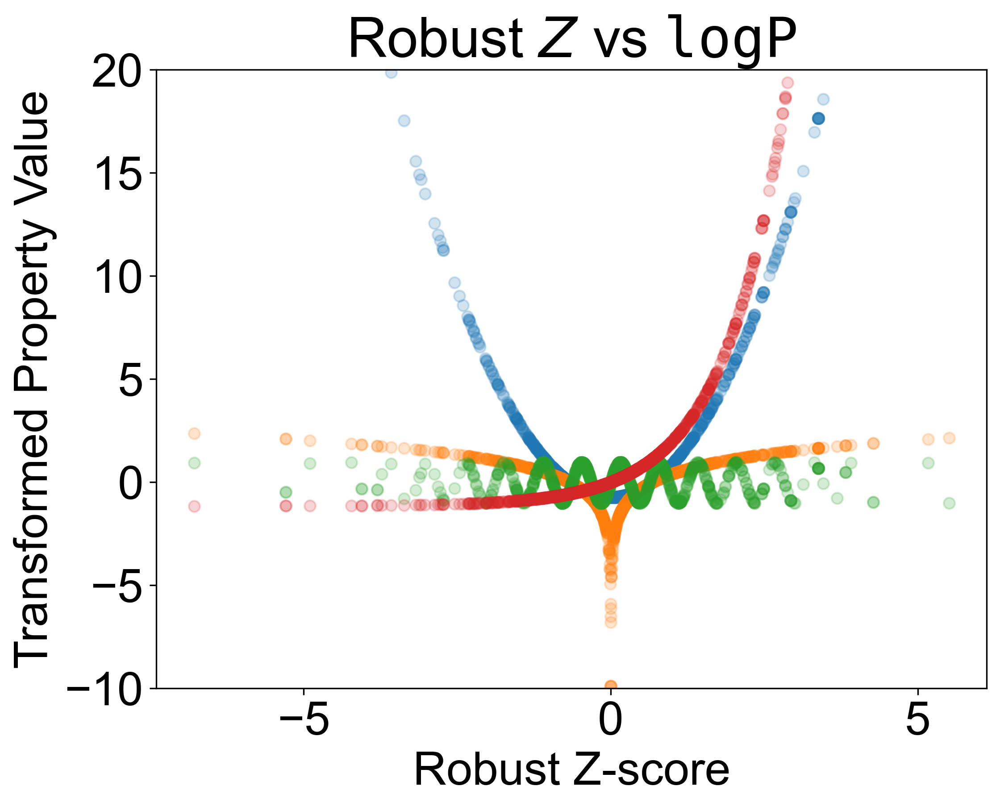

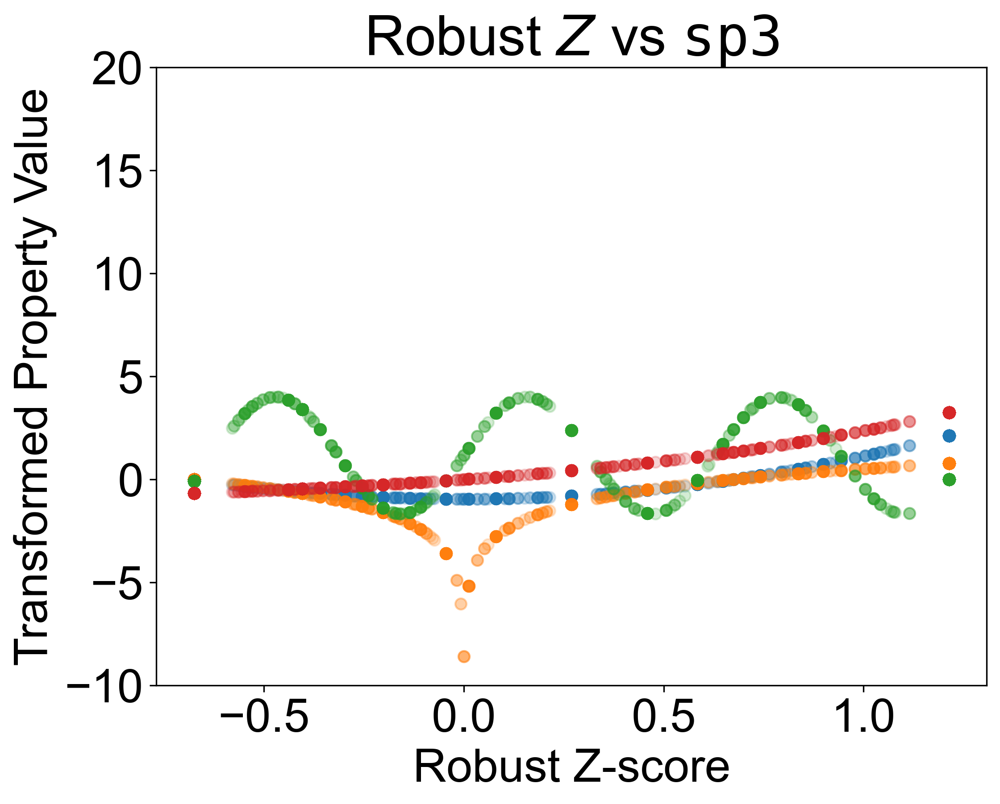

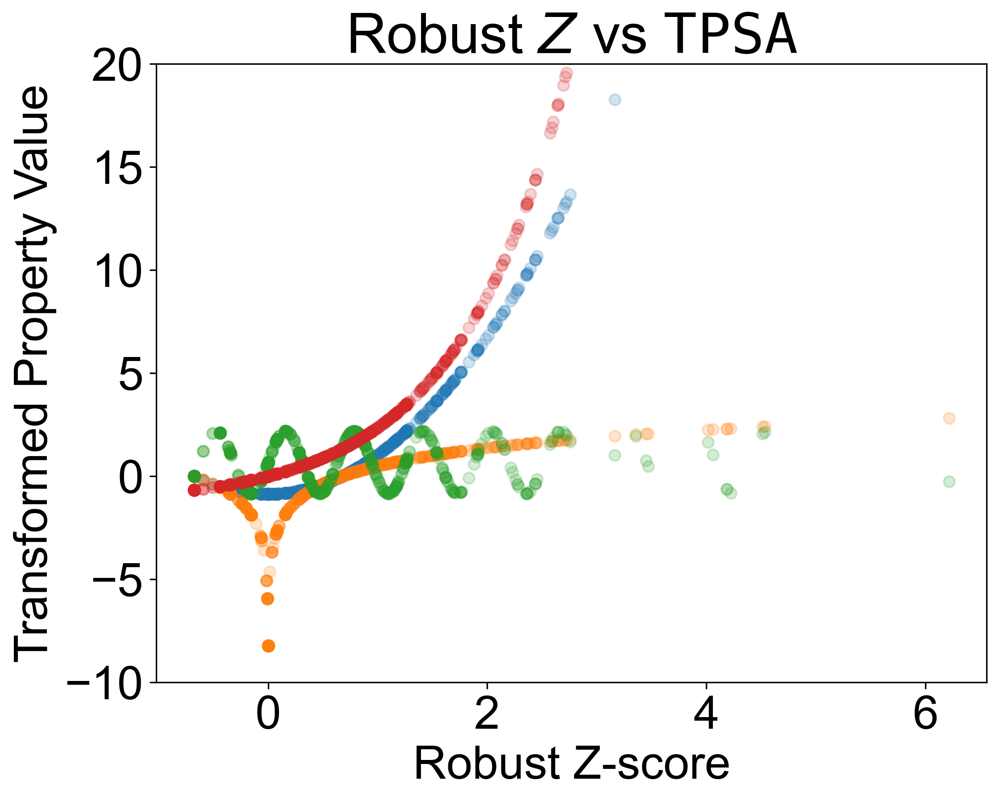

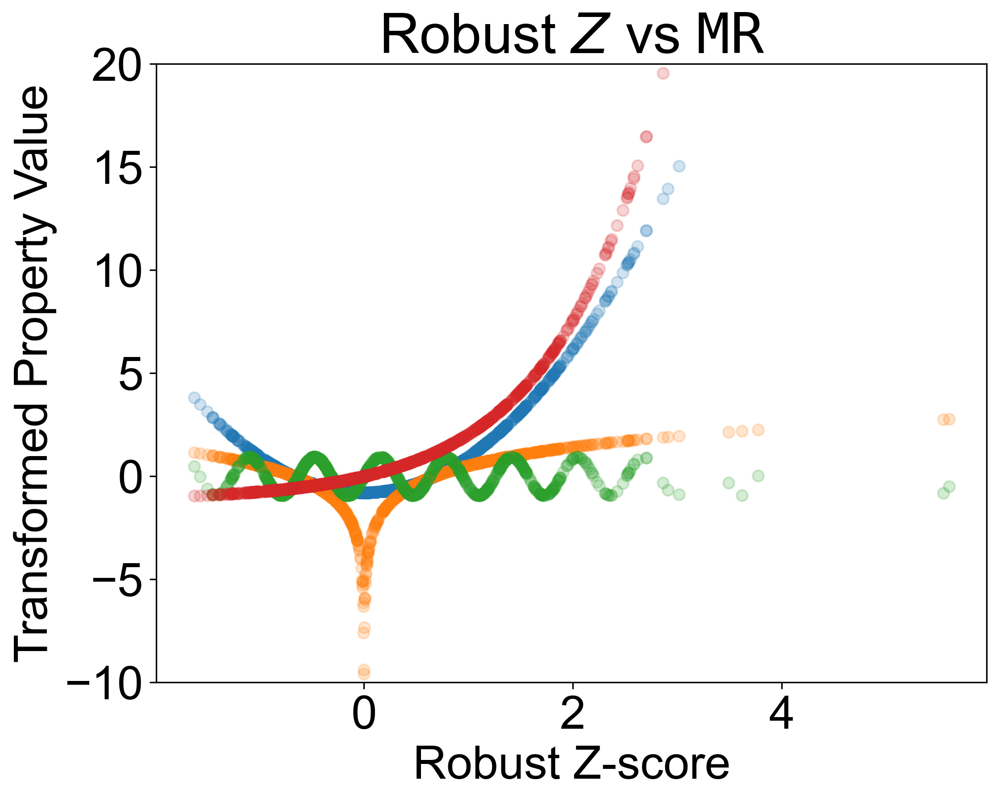

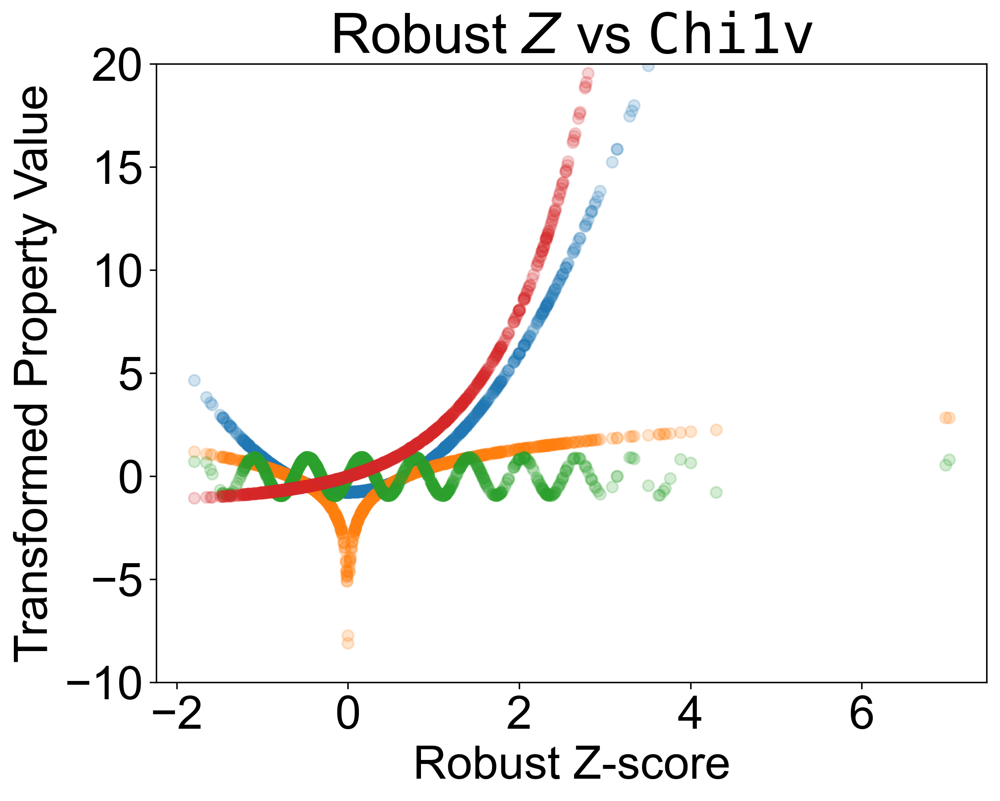

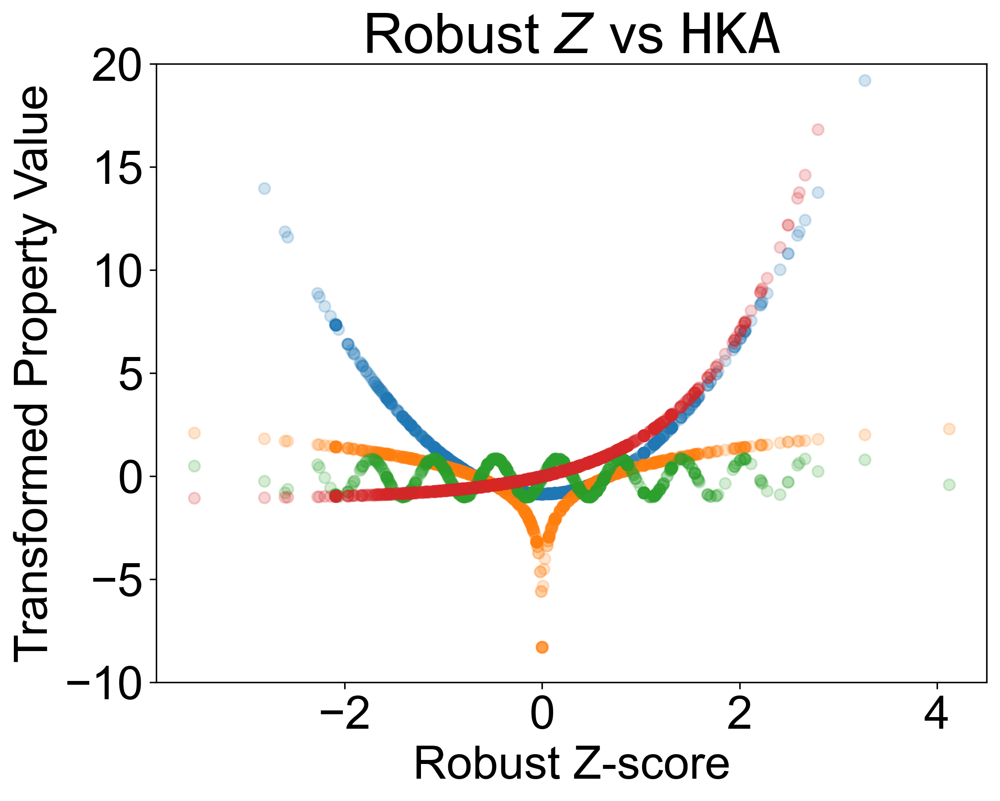

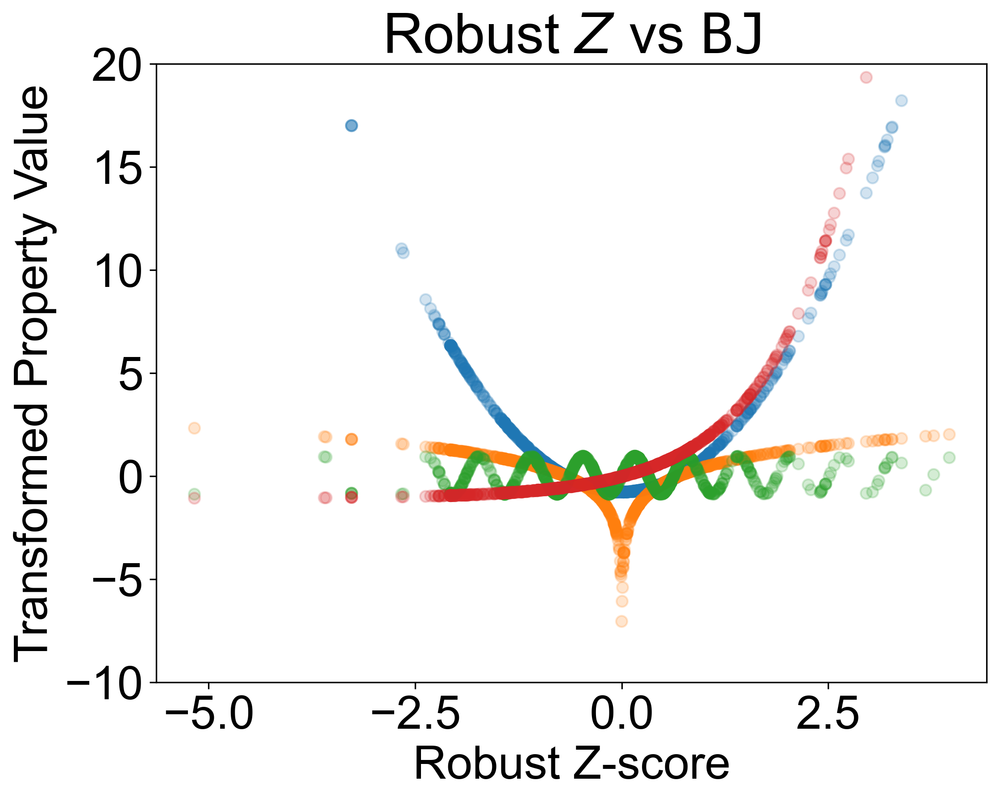

In [39]:
props = ['Molecular Weight', 'LogP', 'sp3', 'TPSA', 'MolMR', 'Chi', 'HKA', 'BJ']
xlabels = [r'$\mathtt{MW}$', r'$\mathtt{logP}$', r'$\mathtt{sp3}$', r'$\mathtt{TPSA}$', r'$\mathtt{MR}$', r'$\mathtt{Chi1v}$', r'$\mathtt{HKA}$', r'$\mathtt{BJ}$']
names = [r'Robust $Z$ vs $\mathtt{MW}$', 
        r'Robust $Z$ vs $\mathtt{logP}$', 
        r'Robust $Z$ vs $\mathtt{sp3}$', 
        r'Robust $Z$ vs $\mathtt{TPSA}$',
        r'Robust $Z$ vs $\mathtt{MR}$', 
        r'Robust $Z$ vs $\mathtt{Chi1v}$', 
        r'Robust $Z$ vs $\mathtt{HKA}$', 
        r'Robust $Z$ vs $\mathtt{BJ}$']

for i in range(len(props)):
   plt.figure(figsize=(8, 6), dpi=300)
   plt.rcParams['font.family'] = 'Arial'
   plt.rcParams['font.size'] = 25
   prop = props[i]
   plt.scatter(esol[f'{prop}_robust_zscore'], esol[f'{prop}_sq'], alpha=0.2, c='C0')
   plt.scatter(esol[f'{prop}_robust_zscore'], esol[f'{prop}_lg'], alpha=0.2, c='C1')
   plt.scatter(esol[f'{prop}_robust_zscore'], esol[f'{prop}_sn'], alpha=0.2, c='C2')
   plt.scatter(esol[f'{prop}_robust_zscore'], esol[f'{prop}_ex'], alpha=0.2, c='C3')
   plt.ylim(-10, 20)
   plt.title(names[i])
   plt.xlabel('Robust Z-score')
   plt.ylabel("Transformed Property Value")
   plt.show()

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.data import Data, DataLoader
from torch_geometric.nn import GCNConv, global_mean_pool, global_max_pool, global_add_pool
from rdkit import Chem
from rdkit.Chem import Descriptors
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 데이터 로드 (원본 코드의 esol 데이터 사용)
esol = pd.read_csv('../delaney-processed.csv')

# BJ 값 계산 (원본 코드와 동일)
print("Computing BJ values...")
esol['BJ'] = esol['smiles'].apply(lambda x: Descriptors.BalabanJ(Chem.MolFromSmiles(x)))
print(f"BJ values computed. Range: {esol['BJ'].min():.3f} to {esol['BJ'].max():.3f}")

def smiles_to_graph(smiles):
    """SMILES를 PyTorch Geometric 그래프로 변환 (일반적인 특성)"""
    try:
        mol = Chem.MolFromSmiles(smiles)
        if mol is None:
            return None
        
        # 원자가 없는 경우 처리
        if mol.GetNumAtoms() == 0:
            return None
        
        # 원자 특성 (노드 특성)
        atom_features = []
        for atom in mol.GetAtoms():
            features = [
                float(atom.GetAtomicNum()),
                float(atom.GetDegree()),
                float(atom.GetFormalCharge()),
                float(atom.GetHybridization()),
                float(atom.GetIsAromatic()),
                float(atom.GetTotalNumHs()),
                float(atom.IsInRing()),
                float(atom.GetMass())
            ]
            atom_features.append(features)
        
        # 엣지 특성
        edge_indices = []
        edge_features = []
        for bond in mol.GetBonds():
            i = bond.GetBeginAtomIdx()
            j = bond.GetEndAtomIdx()
            
            # 양방향 엣지
            edge_indices.extend([[i, j], [j, i]])
            
            # 결합 특성
            bond_features = [
                float(bond.GetBondType()),
                float(bond.GetIsConjugated()),
                float(bond.IsInRing())
            ]
            edge_features.extend([bond_features, bond_features])
        
        # 그래프 전역 특성 (일반적인 분자 특성)
        num_atoms = mol.GetNumAtoms()
        num_bonds = mol.GetNumBonds()
        
        global_features = [
            float(num_atoms),                            # 원자 개수
            float(num_bonds),                            # 결합 개수
            float(num_bonds / num_atoms if num_atoms > 0 else 0),  # 결합 밀도
            float(Descriptors.MolWt(mol)),               # 분자량
            float(Descriptors.MolLogP(mol)),             # LogP
            float(Descriptors.TPSA(mol)),                # TPSA
            float(Descriptors.NumRotatableBonds(mol)),   # 회전 가능한 결합 수
            float(Descriptors.NumHDonors(mol)),          # 수소 결합 공여체 수
            float(Descriptors.NumHAcceptors(mol)),       # 수소 결합 수용체 수
            float(Descriptors.RingCount(mol)),           # 고리 개수
            float(Descriptors.NumAromaticRings(mol)),    # 방향족 고리 개수
            float(Descriptors.FractionCSP3(mol)),        # sp3 탄소 비율
            float(Descriptors.HallKierAlpha(mol)),       # Hall-Kier alpha
            float(Descriptors.Chi1v(mol)),               # 연결성 지수
            float(len(smiles))                           # SMILES 길이
        ]
        
        # PyTorch tensors로 변환
        x = torch.tensor(atom_features, dtype=torch.float)
        global_attr = torch.tensor(global_features, dtype=torch.float)
        
        if edge_indices:
            edge_index = torch.tensor(edge_indices, dtype=torch.long).t().contiguous()
            edge_attr = torch.tensor(edge_features, dtype=torch.float)
        else:
            edge_index = torch.empty((2, 0), dtype=torch.long)
            edge_attr = torch.empty((0, 3), dtype=torch.float)
        
        return Data(x=x, edge_index=edge_index, edge_attr=edge_attr, global_attr=global_attr)
    
    except Exception as e:
        print(f"Error converting SMILES {smiles}: {e}")
        return None

class SimpleGNN(nn.Module):
    """간단하고 안정적인 GNN 모델"""
    def __init__(self, num_node_features, num_global_features, hidden_dim=64, dropout=0.2):
        super(SimpleGNN, self).__init__()
        
        self.hidden_dim = hidden_dim
        self.dropout = dropout
        
        # GCN layers
        self.conv1 = GCNConv(num_node_features, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, hidden_dim)
        self.conv3 = GCNConv(hidden_dim, hidden_dim)
        
        # Batch normalization
        self.bn1 = nn.BatchNorm1d(hidden_dim)
        self.bn2 = nn.BatchNorm1d(hidden_dim)
        self.bn3 = nn.BatchNorm1d(hidden_dim)
        
        # Global features processing
        self.global_fc = nn.Sequential(
            nn.Linear(num_global_features, hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, hidden_dim)
        )
        
        self.global_bn = nn.BatchNorm1d(hidden_dim)
        
        # Final prediction layers
        # Graph pooling: hidden_dim * 3, Global: hidden_dim
        self.fc1 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc2 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, 1)
        
        self.dropout_layer = nn.Dropout(dropout)
        
    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch
        global_attr = data.global_attr
        
        # Graph convolutions
        x = self.conv1(x, edge_index)
        x = self.bn1(x)
        x = F.relu(x)
        x = self.dropout_layer(x)
        
        x = self.conv2(x, edge_index)
        x = self.bn2(x)
        x = F.relu(x)
        x = self.dropout_layer(x)
        
        x = self.conv3(x, edge_index)
        x = self.bn3(x)
        x = F.relu(x)
        
        # Global pooling
        x1 = global_mean_pool(x, batch)
        x2 = global_max_pool(x, batch)
        x3 = global_add_pool(x, batch)
        
        # Process global features
        global_repr = self.global_fc(global_attr)
        global_repr = self.global_bn(global_repr)
        global_repr = F.relu(global_repr)
        
        # Combine all representations
        combined = torch.cat([x1, x2, x3, global_repr], dim=1)
        
        # Final prediction
        x = F.relu(self.fc1(combined))
        x = self.dropout_layer(x)
        x = F.relu(self.fc2(x))
        x = self.dropout_layer(x)
        x = self.fc3(x)
        
        return x.squeeze(-1)
    """Graph Neural Network 모델 (동적 차원 처리)"""
    def __init__(self, num_node_features, num_edge_features=3, num_global_features=15, hidden_dim=64, num_layers=3, dropout=0.2):
        super(GNN, self).__init__()
        
        self.num_layers = num_layers
        self.dropout = dropout
        self.hidden_dim = hidden_dim
        
        # GCN layers
        self.convs = nn.ModuleList()
        self.convs.append(GCNConv(num_node_features, hidden_dim))
        for _ in range(num_layers - 1):
            self.convs.append(GCNConv(hidden_dim, hidden_dim))
        
        # Batch normalization layers for graph convolutions
        self.batch_norms = nn.ModuleList()
        for _ in range(num_layers):
            self.batch_norms.append(nn.BatchNorm1d(hidden_dim))
        
        # Global features processing - 동적으로 초기화됨
        self.global_fc = None
        self.global_bn = None
        self.num_global_features = num_global_features
        
        # Final prediction layers - 동적으로 초기화됨
        self.fc1 = None
        self.fc2 = None 
        self.fc3 = None
        self.fc4 = None
        
        self.dropout_layer = nn.Dropout(dropout)
        self._initialized = False
        
    def _initialize_layers(self, actual_global_features):
        """실제 전역 특성 차원에 맞춰 레이어 초기화"""
        if self._initialized:
            return
            
        # Global features processing
        self.global_fc = nn.Sequential(
            nn.Linear(actual_global_features, self.hidden_dim),
            nn.ReLU(),
            nn.Dropout(self.dropout),
            nn.Linear(self.hidden_dim, self.hidden_dim)
        ).to(next(self.parameters()).device)
        
        # Global feature batch normalization
        self.global_bn = nn.BatchNorm1d(self.hidden_dim).to(next(self.parameters()).device)
        
        # Final prediction layers
        # Graph pooling: hidden_dim * 3, Global: hidden_dim
        total_dim = self.hidden_dim * 4
        self.fc1 = nn.Linear(total_dim, self.hidden_dim * 2).to(next(self.parameters()).device)
        self.fc2 = nn.Linear(self.hidden_dim * 2, self.hidden_dim).to(next(self.parameters()).device)
        self.fc3 = nn.Linear(self.hidden_dim, self.hidden_dim // 2).to(next(self.parameters()).device)
        self.fc4 = nn.Linear(self.hidden_dim // 2, 1).to(next(self.parameters()).device)
        
        self._initialized = True
        
    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch
        global_attr = data.global_attr
        
        # 동적으로 레이어 초기화
        if not self._initialized:
            actual_global_features = global_attr.shape[1]
            print(f"Initializing with actual global features: {actual_global_features}")
            self._initialize_layers(actual_global_features)
        
        # Graph convolutions
        for i, (conv, bn) in enumerate(zip(self.convs, self.batch_norms)):
            x = conv(x, edge_index)
            x = bn(x)
            x = F.relu(x)
            if i < len(self.convs) - 1:
                x = self.dropout_layer(x)
        
        # Global pooling (combine different pooling methods)
        x1 = global_mean_pool(x, batch)  # 평균 풀링
        x2 = global_max_pool(x, batch)   # 최대 풀링
        x3 = global_add_pool(x, batch)   # 합계 풀링
        
        # Process global features
        global_repr = self.global_fc(global_attr)
        global_repr = self.global_bn(global_repr)
        global_repr = F.relu(global_repr)
        
        # Combine all representations
        combined = torch.cat([x1, x2, x3, global_repr], dim=1)  # hidden_dim * 4
        
        # Final prediction with deeper network
        x = F.relu(self.fc1(combined))
        x = self.dropout_layer(x)
        x = F.relu(self.fc2(x))
        x = self.dropout_layer(x)
        x = F.relu(self.fc3(x))
        x = self.dropout_layer(x)
        x = self.fc4(x)
        
        return x.squeeze(-1)

def prepare_data(df):
    """데이터를 그래프 형태로 준비"""
    graphs = []
    targets = []
    valid_indices = []
    
    print("Converting SMILES to graphs...")
    for idx, row in df.iterrows():
        if idx % 100 == 0:
            print(f"Processed {idx}/{len(df)} molecules")
            
        graph = smiles_to_graph(row['smiles'])
        if graph is not None and not np.isnan(row['BJ']) and np.isfinite(row['BJ']):
            graphs.append(graph)
            targets.append(float(row['BJ']))
            valid_indices.append(idx)
    
    print(f"Successfully converted {len(graphs)} molecules")
    return graphs, np.array(targets), valid_indices

def train_and_predict(train_graphs, train_targets, test_graphs, test_targets, device, return_history=False):
    """GNN 모델 훈련 및 예측"""
    try:
        # 입력 검증
        if len(train_graphs) == 0 or len(test_graphs) == 0:
            raise ValueError("Empty train or test set")
        
        # 타겟을 numpy 배열로 확실히 변환
        train_targets = np.array(train_targets).astype(float)
        test_targets = np.array(test_targets).astype(float)
        
        # 단일 값인 경우 1차원 배열로 만들기
        if train_targets.ndim == 0:
            train_targets = np.array([train_targets])
        if test_targets.ndim == 0:
            test_targets = np.array([test_targets])
        
        print(f"Train size: {len(train_graphs)}, Test size: {len(test_graphs)}")
        print(f"Train targets shape: {train_targets.shape}, Test targets shape: {test_targets.shape}")
        
        # 디버깅: 차원 정보 출력
        print(f"Node features shape: {train_graphs[0].x.shape}")
        print(f"Edge features shape: {train_graphs[0].edge_attr.shape}")
        print(f"Global features shape: {train_graphs[0].global_attr.shape}")
        
        # 타겟 정규화
        scaler = StandardScaler()
        train_targets_scaled = scaler.fit_transform(train_targets.reshape(-1, 1)).flatten()
        test_targets_scaled = scaler.transform(test_targets.reshape(-1, 1)).flatten()
        
        # 타겟을 그래프 데이터에 추가
        for graph, target in zip(train_graphs, train_targets_scaled):
            graph.y = torch.tensor(target, dtype=torch.float)
        
        for graph, target in zip(test_graphs, test_targets_scaled):
            graph.y = torch.tensor(target, dtype=torch.float)
        
        # DataLoader 생성
        train_loader = DataLoader(train_graphs, batch_size=min(16, len(train_graphs)), shuffle=True)
        test_loader = DataLoader(test_graphs, batch_size=len(test_graphs), shuffle=False)
        
        # 모델 초기화 - 간단한 방법으로 변경
        num_node_features = train_graphs[0].x.shape[1]
        num_edge_features = train_graphs[0].edge_attr.shape[1] if train_graphs[0].edge_attr.size(0) > 0 else 3
        num_global_features = train_graphs[0].global_attr.shape[0]
        
        print(f"Model dimensions - Node: {num_node_features}, Edge: {num_edge_features}, Global: {num_global_features}")
        
        # 간단한 GNN 모델 사용
        model = SimpleGNN(num_node_features, num_global_features).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=1e-4)
        criterion = nn.MSELoss()
        
        # 훈련 기록을 위한 리스트
        train_losses = []
        test_losses = []
        epochs_list = []
        
        # 훈련
        model.train()
        num_epochs = min(100, max(20, len(train_graphs) * 2))
        
        for epoch in range(num_epochs):
            # 훈련 loss 계산
            total_train_loss = 0
            num_batches = 0
            for batch in train_loader:
                batch = batch.to(device)
                optimizer.zero_grad()
                out = model(batch)
                loss = criterion(out, batch.y)
                loss.backward()
                optimizer.step()
                total_train_loss += loss.item()
                num_batches += 1
            
            avg_train_loss = total_train_loss / num_batches if num_batches > 0 else 0
            
            # 테스트 loss 계산 (매 에포크마다)
            model.eval()
            total_test_loss = 0
            with torch.no_grad():
                for batch in test_loader:
                    batch = batch.to(device)
                    out = model(batch)
                    test_loss = criterion(out, batch.y)
                    total_test_loss += test_loss.item()
            
            # 기록 저장 (10 에포크마다 또는 마지막 에포크)
            if epoch % max(1, num_epochs // 10) == 0 or epoch == num_epochs - 1:
                train_losses.append(avg_train_loss)
                test_losses.append(total_test_loss)
                epochs_list.append(epoch)
            
            model.train()
        
        # 최종 예측
        model.eval()
        with torch.no_grad():
            for batch in test_loader:
                batch = batch.to(device)
                predictions_scaled = model(batch).cpu().numpy()
        
        # 원래 스케일로 변환
        if predictions_scaled.ndim == 0:
            predictions_scaled = np.array([predictions_scaled])
        
        predictions = scaler.inverse_transform(predictions_scaled.reshape(-1, 1)).flatten()
        
        # 단일 값인 경우 스칼라로 변환
        if len(predictions) == 1:
            predictions = predictions[0]
        if len(test_targets) == 1:
            test_targets = test_targets[0]
        
        if return_history:
            return predictions, test_targets, {
                'train_losses': train_losses,
                'test_losses': test_losses,
                'epochs': epochs_list
            }
        else:
            return predictions, test_targets
        
    except Exception as e:
        print(f"Error in train_and_predict: {e}")
        import traceback
        traceback.print_exc()
        raise e

def plot_learning_curves(all_histories, save_plot=True):
    """Learning curve 시각화"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # 개별 learning curves (첫 10개만)
    ax1.set_title('Individual Learning Curves (First 10 runs)', fontsize=14)
    colors = plt.cm.tab10(np.linspace(0, 1, min(10, len(all_histories))))
    
    for i, (seed, history) in enumerate(list(all_histories.items())[:10]):
        if history is not None:
            ax1.plot(history['epochs'], history['train_losses'], 
                    color=colors[i], alpha=0.7, linewidth=1, label=f'Train {seed}')
            ax1.plot(history['epochs'], history['test_losses'], 
                    color=colors[i], alpha=0.7, linewidth=1, linestyle='--', label=f'Test {seed}')
    
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('MSE Loss')
    ax1.set_yscale('log')
    ax1.grid(True, alpha=0.3)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    
    # 평균 learning curve
    ax2.set_title('Average Learning Curve', fontsize=14)
    
    # 모든 성공한 실험의 loss 평균 계산
    valid_histories = [h for h in all_histories.values() if h is not None]
    
    if valid_histories:
        # 에포크 수가 다를 수 있으므로 가장 짧은 것에 맞춤
        min_epochs = min(len(h['epochs']) for h in valid_histories)
        
        avg_train_losses = []
        avg_test_losses = []
        std_train_losses = []
        std_test_losses = []
        epochs = valid_histories[0]['epochs'][:min_epochs]
        
        for i in range(min_epochs):
            train_losses_at_epoch = [h['train_losses'][i] for h in valid_histories if len(h['train_losses']) > i]
            test_losses_at_epoch = [h['test_losses'][i] for h in valid_histories if len(h['test_losses']) > i]
            
            avg_train_losses.append(np.mean(train_losses_at_epoch))
            avg_test_losses.append(np.mean(test_losses_at_epoch))
            std_train_losses.append(np.std(train_losses_at_epoch))
            std_test_losses.append(np.std(test_losses_at_epoch))
        
        # 평균과 표준편차 플롯
        ax2.plot(epochs, avg_train_losses, 'b-', linewidth=2, label=f'Train (avg of {len(valid_histories)} runs)')
        ax2.fill_between(epochs, 
                        np.array(avg_train_losses) - np.array(std_train_losses),
                        np.array(avg_train_losses) + np.array(std_train_losses),
                        alpha=0.3, color='blue')
        
        ax2.plot(epochs, avg_test_losses, 'r--', linewidth=2, label=f'Test (avg of {len(valid_histories)} runs)')
        ax2.fill_between(epochs,
                        np.array(avg_test_losses) - np.array(std_test_losses),
                        np.array(avg_test_losses) + np.array(std_test_losses),
                        alpha=0.3, color='red')
    
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('MSE Loss')
    ax2.set_yscale('log')
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    
    plt.tight_layout()
    
    if save_plot:
        plt.savefig('gnn_learning_curves.png', dpi=300, bbox_inches='tight')
        print("Learning curves saved as 'gnn_learning_curves.png'")
    
    plt.show()

def plot_prediction_scatter(all_predictions, all_actuals, save_plot=True):
    """예측값 vs 실제값 산점도"""
    plt.figure(figsize=(8, 8))
    
    plt.scatter(all_actuals, all_predictions, alpha=0.6, s=50)
    
    # 완벽한 예측선 (y=x)
    min_val = min(min(all_actuals), min(all_predictions))
    max_val = max(max(all_actuals), max(all_predictions))
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2, label='Perfect Prediction')
    
    # R² 값 표시
    r2 = r2_score(all_actuals, all_predictions)
    mae = mean_absolute_error(all_actuals, all_predictions)
    
    plt.xlabel('Actual BJ Values', fontsize=12)
    plt.ylabel('Predicted BJ Values', fontsize=12)
    plt.title(f'GNN Predictions vs Actual Values\nR² = {r2:.4f}, MAE = {mae:.4f}', fontsize=14)
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 축 범위 동일하게 설정
    plt.xlim(min_val, max_val)
    plt.ylim(min_val, max_val)
    
    if save_plot:
        plt.savefig('gnn_predictions_scatter.png', dpi=300, bbox_inches='tight')
        print("Prediction scatter plot saved as 'gnn_predictions_scatter.png'")
    
    plt.show()
    """GNN 실험 실행 (100번 반복)"""
    print("Starting GNN experiment for BJ prediction...")
    
    # GPU 사용 가능한지 확인
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    # 전체 데이터 준비
    all_graphs, all_targets, valid_indices = prepare_data(esol)
    print(f"Total valid molecules: {len(all_graphs)}")
    
    if len(all_graphs) < 51:  # 최소 51개 필요 (50개 훈련 + 1개 테스트)
        print("Not enough valid molecules for experiment")
        return None, None, None
    
    # 모든 예측값과 실제값을 저장할 리스트
    all_predictions = []
    all_actuals = []
    mae_scores = []
    success_count = 0
    
    for seed in range(1, 101):
        if seed % 10 == 0:
            print(f"Processing iteration {seed}/100, Success: {success_count}/{seed-1}")
        
        try:
            # 시드 설정
            np.random.seed(seed)
            torch.manual_seed(seed)
            if torch.cuda.is_available():
                torch.cuda.manual_seed(seed)
            
            # 데이터 분할 (원본 코드와 동일)
            # 1개 테스트, 50개 훈련
            all_indices = np.arange(len(all_graphs))
            test_idx = np.random.choice(all_indices, size=1, replace=False)[0]
            remaining_indices = np.delete(all_indices, test_idx)
            train_indices = np.random.choice(remaining_indices, size=min(50, len(remaining_indices)), replace=False)
            
            # 데이터 추출
            train_graphs = [all_graphs[i] for i in train_indices]
            train_targets = all_targets[train_indices]
            test_graphs = [all_graphs[test_idx]]
            test_targets = all_targets[test_idx]
            
            # 모델 훈련 및 예측
            predictions, actual = train_and_predict(train_graphs, train_targets, test_graphs, test_targets, device)
            
            # 예측값과 실제값을 전체 리스트에 추가
            all_predictions.append(float(predictions))
            all_actuals.append(float(actual))
            
            # 개별 MAE 계산
            mae = abs(float(actual) - float(predictions))
            mae_scores.append(mae)
            success_count += 1
            
        except Exception as e:
            if seed <= 5:  # 처음 5번만 에러 출력
                print(f"Error in iteration {seed}: {e}")
            mae_scores.append(np.nan)
    
    # 성공한 실험만 필터링
    valid_mae = [score for score in mae_scores if not np.isnan(score)]
    
    if len(all_predictions) == 0:
        print("No successful iterations!")
        return None, None, None
    
    # 100번 실험의 전체 결과에 대한 R² 계산
    all_predictions = np.array(all_predictions)
    all_actuals = np.array(all_actuals)
    overall_r2 = r2_score(all_actuals, all_predictions)
    overall_mae = mean_absolute_error(all_actuals, all_predictions)
    
    results = {
        'Mean_MAE': np.mean(valid_mae),
        'Std_MAE': np.std(valid_mae),
        'Median_MAE': np.median(valid_mae),
        'Overall_MAE': overall_mae,  # 전체 100개에 대한 MAE
        'Overall_R2': overall_r2,    # 전체 100개에 대한 R²
        'Success_Rate': len(valid_mae) / 100,
        'Total_Predictions': len(all_predictions)
    }
    
    print(f"\n=== GNN Results for BJ Prediction ===")
    print(f"Successful iterations: {len(all_predictions)}/100")
    print(f"Individual MAE - Mean: {results['Mean_MAE']:.4f} ± {results['Std_MAE']:.4f}")
    print(f"Individual MAE - Median: {results['Median_MAE']:.4f}")
    print(f"Overall MAE (all 100 predictions): {results['Overall_MAE']:.4f}")
    print(f"Overall R² (all 100 predictions): {results['Overall_R2']:.4f}")
    print(f"Success Rate: {results['Success_Rate']:.2%}")
    
    return results, all_predictions, all_actuals

# 실험 실행
if __name__ == "__main__":
    # PyTorch Geometric 설치 확인
    try:
        import torch_geometric
        print("PyTorch Geometric is available")
        results, mae_scores, r2_scores = run_gnn_experiment()
    except ImportError:
        print("PyTorch Geometric is not installed. Please install it using:")
        print("pip install torch-geometric")
        print("or")
        print("conda install pyg -c pyg")

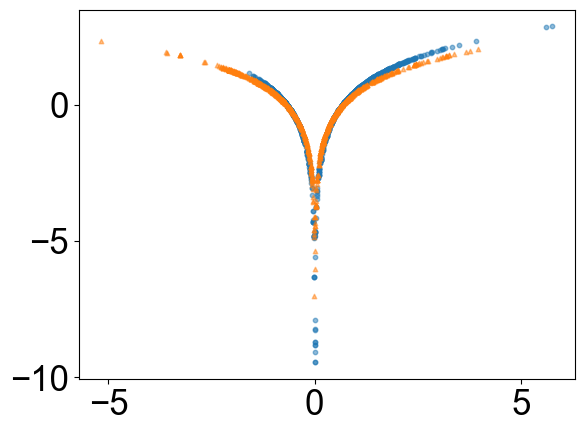

In [29]:
prop1, prop2 = 'Molecular Weight', 'BJ'
plt.scatter(esol[f'{prop1}_robust_zscore'], esol[f'{prop1}_lg'], alpha=0.5, marker = 'o', s = 10, c = 'C0')
plt.scatter(esol[f'{prop2}_robust_zscore'], esol[f'{prop2}_lg'], alpha=0.5, marker = '^', s = 10, c = 'C1')

(array([375., 753.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.]),
 array([-1226.93881975,  -193.94793366,   839.04295242,  1872.0338385 ,
         2905.02472458,  3938.01561067,  4971.00649675,  6003.99738283,
         7036.98826891,  8069.979155  ,  9102.97004108, 10135.96092716,
        11168.95181324, 12201.94269933, 13234.93358541, 14267.92447149,
        15300.91535757, 16333.90624366, 17366.89712974, 18399.88801582,
        19432.8789019 , 20465.86978799, 21498.86067407, 22531.85156015,
        23564.84244623, 24597.83333232, 25630.8242184 , 26663.81510448,
        27696.80599056, 28729.79687665]),
 <BarContainer object of 29 artists>)

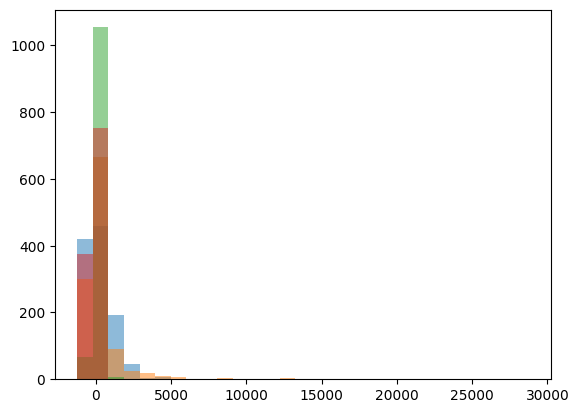

In [24]:
min_val = np.concatenate((esol[f'{prop}_lt'].values, esol[f'{prop}_sq'].values, esol[f'{prop}_lg'].values, esol[f'{prop}_sn'].values)).min()
max_val = np.concatenate((esol[f'{prop}_lt'].values, esol[f'{prop}_sq'].values, esol[f'{prop}_lg'].values, esol[f'{prop}_sn'].values)).max()
bins = np.linspace(min_val, max_val, 30)
plt.hist(esol[f'{prop}_lt'], alpha = 0.5, bins = bins)
plt.hist(esol[f'{prop}_sq'], alpha = 0.5, bins = bins)
plt.hist(esol[f'{prop}_lg'], alpha = 0.5, bins = bins)
plt.hist(esol[f'{prop}_sn'], alpha = 0.5, bins = bins)

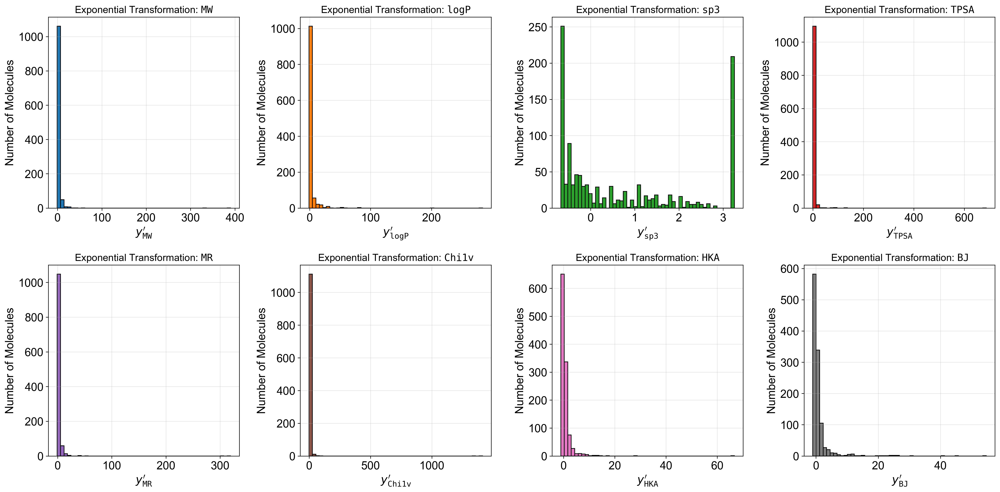

In [25]:
import matplotlib.pyplot as plt
import numpy as np

props = ['Molecular Weight', 'LogP', 'sp3', 'TPSA', 'MolMR', 'Chi', 'HKA', 'BJ']
xlabels = [r"$y_\mathtt{MW}'$", r"$y_\mathtt{logP}'$", r"$y_\mathtt{sp3}'$", r"$y_\mathtt{TPSA}'$", r"$y_\mathtt{MR}'$",r"$y_\mathtt{Chi1v}'$", r"$y_\mathtt{HKA}'$", r"$y_\mathtt{BJ}'$"]
task = 'Exponential Transformation'
names = [f'{task}: '+r'$\mathtt{MW}$', 
        f'{task}: '+r'$\mathtt{logP}$', 
        f'{task}: '+r'$\mathtt{sp3}$', 
        f'{task}: '+r'$\mathtt{TPSA}$',
        f'{task}: '+r'$\mathtt{MR}$', 
        f'{task}: '+r'$\mathtt{Chi1v}$', 
        f'{task}: '+r'$\mathtt{HKA}$', 
        f'{task}: '+r'$\mathtt{BJ}$']

# bins = np.linspace(-5, 5, 50)

# 2행 4열 서브플롯 생성
fig, axes = plt.subplots(2, 4, figsize=(20, 10), dpi=300)
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 16  # 전체 크기에 맞게 폰트 크기 조정

# axes를 1차원으로 평탄화
axes = axes.flatten()

for i in range(len(props)):
    prop = props[i]
    ax = axes[i]
    
    # 히스토그램 그리기
    ax.hist(esol[f'{prop}_ex'], bins=50, color=f'C{i}', edgecolor='black')
    # ax.set_xlim(-5, 5)
    ax.set_xlabel(xlabels[i])
    ax.set_title(names[i], fontsize=14)  # 제목 폰트 크기 조정
    ax.set_ylabel('Number of Molecules')
    
    # 격자 추가 (선택사항)
    ax.grid(True, alpha=0.3)

# 레이아웃 조정
plt.tight_layout()
plt.show()

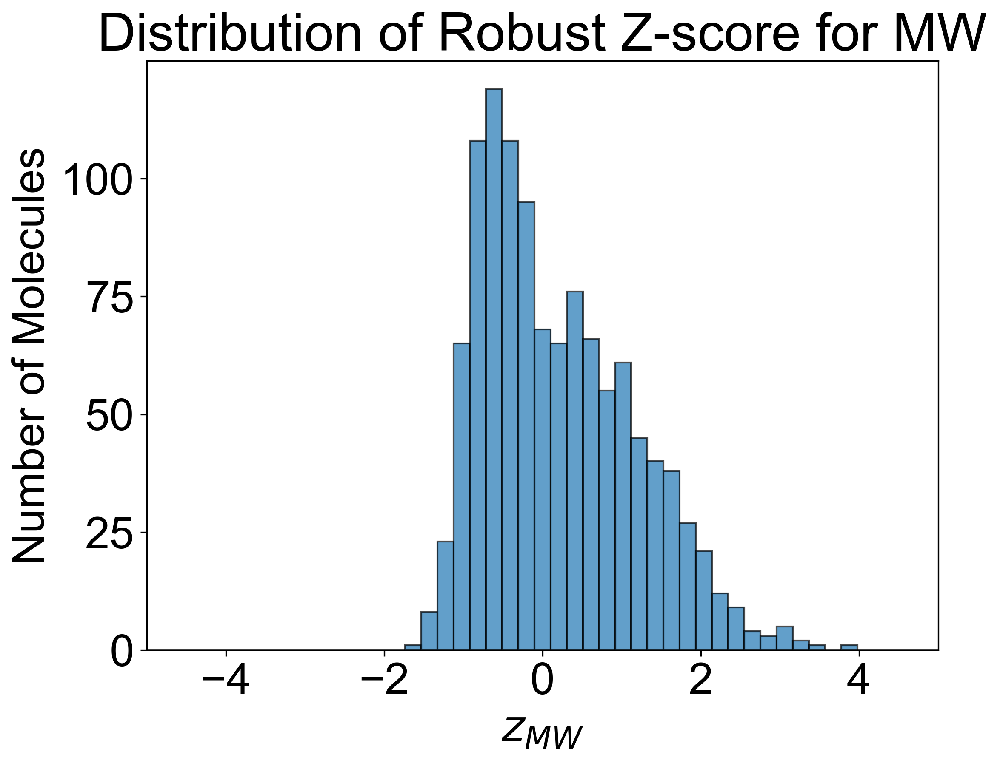

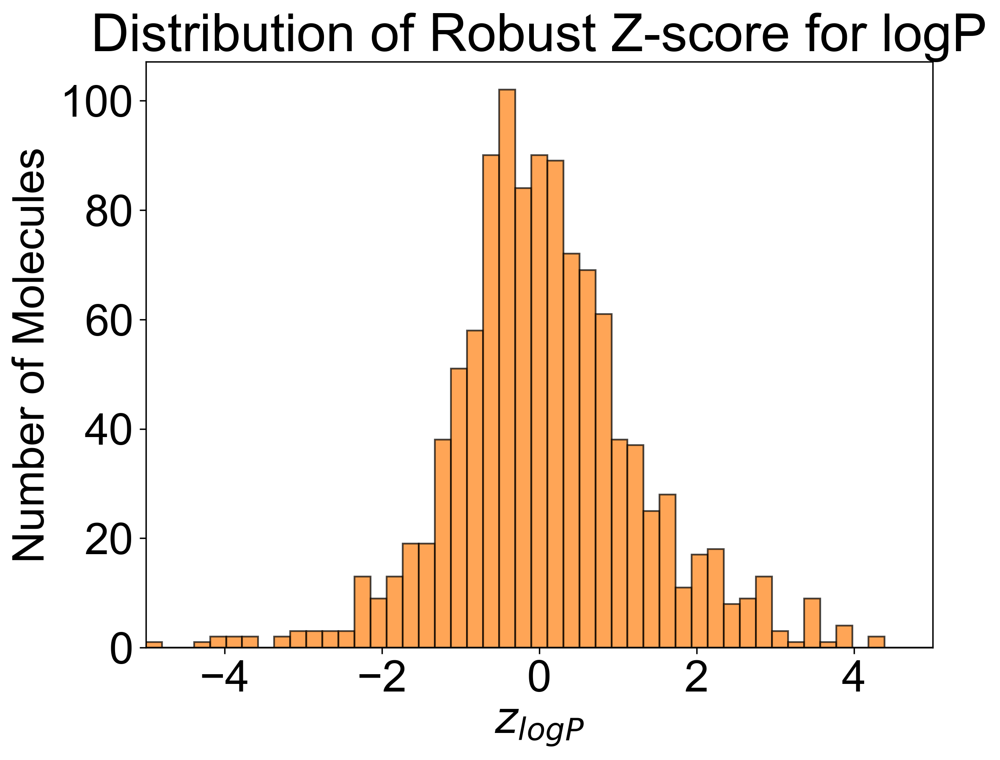

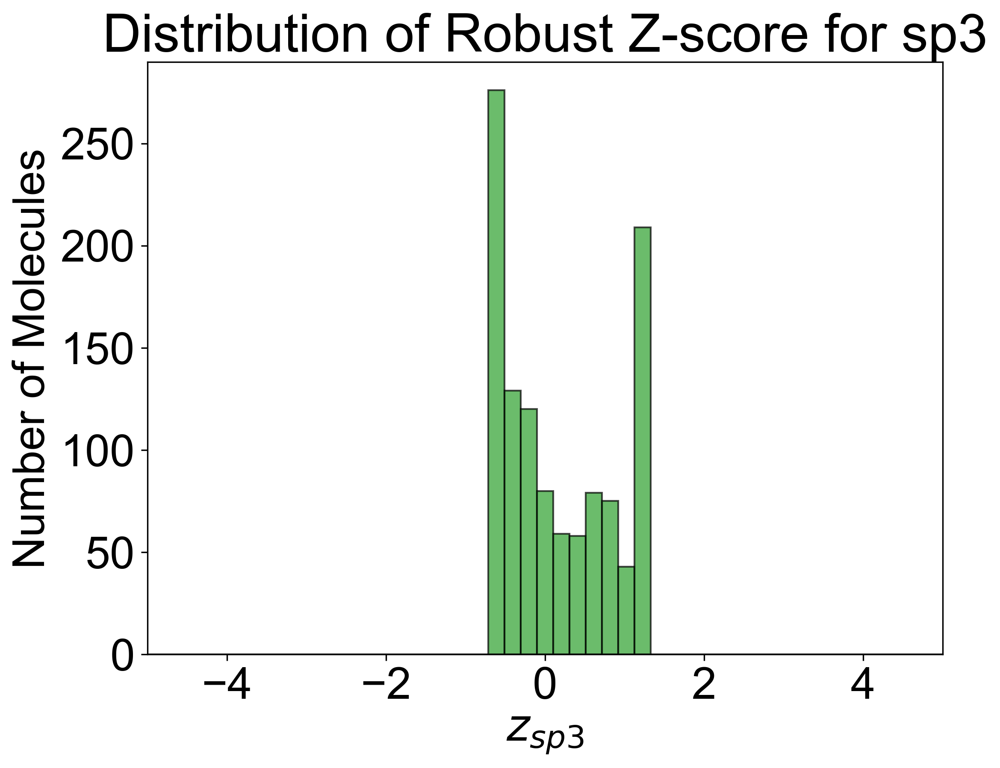

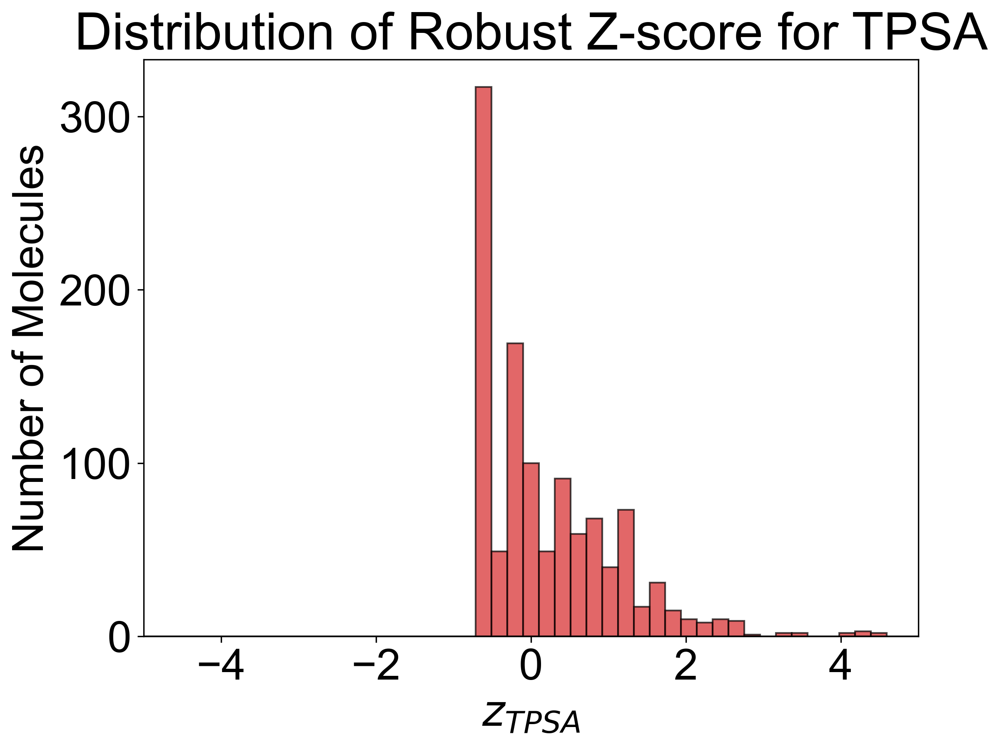

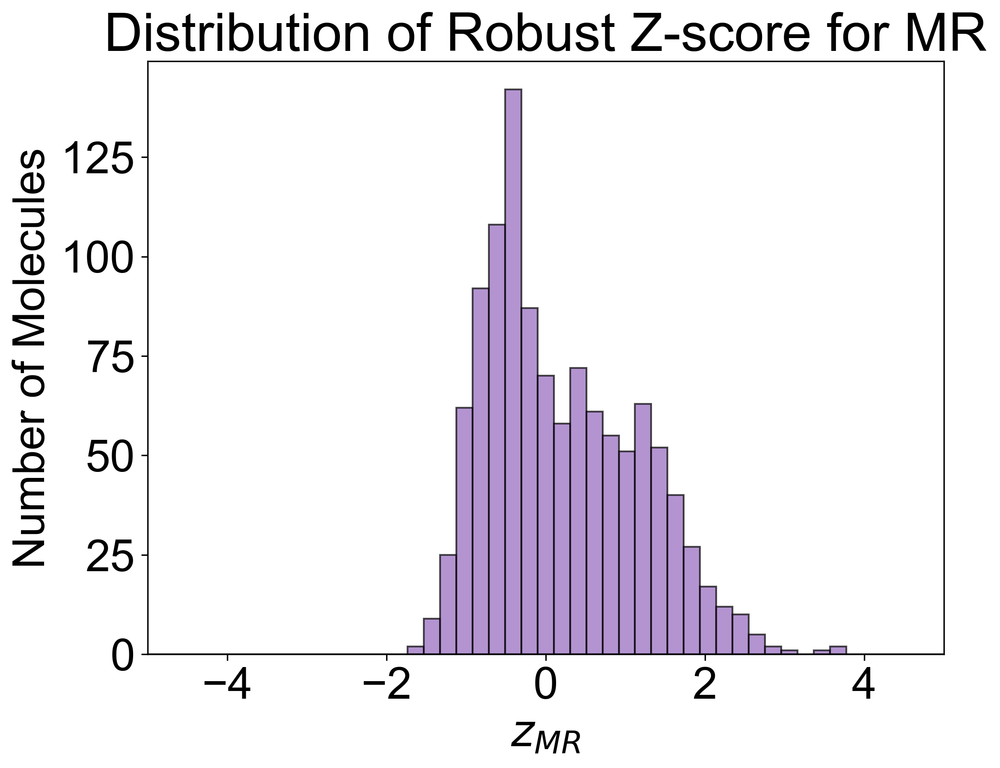

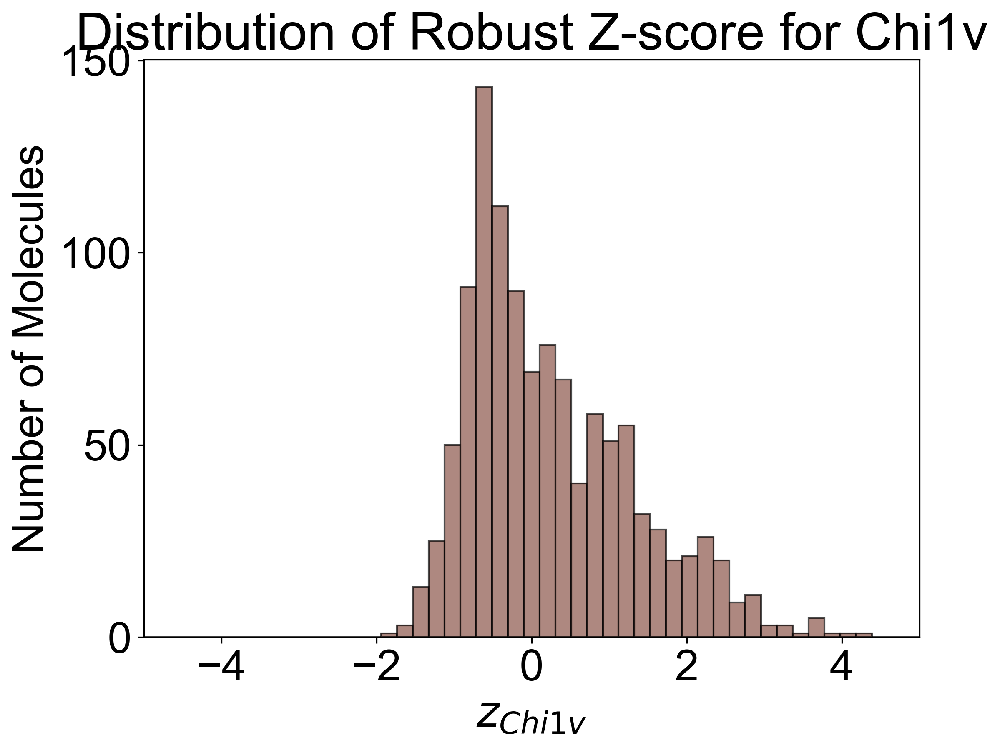

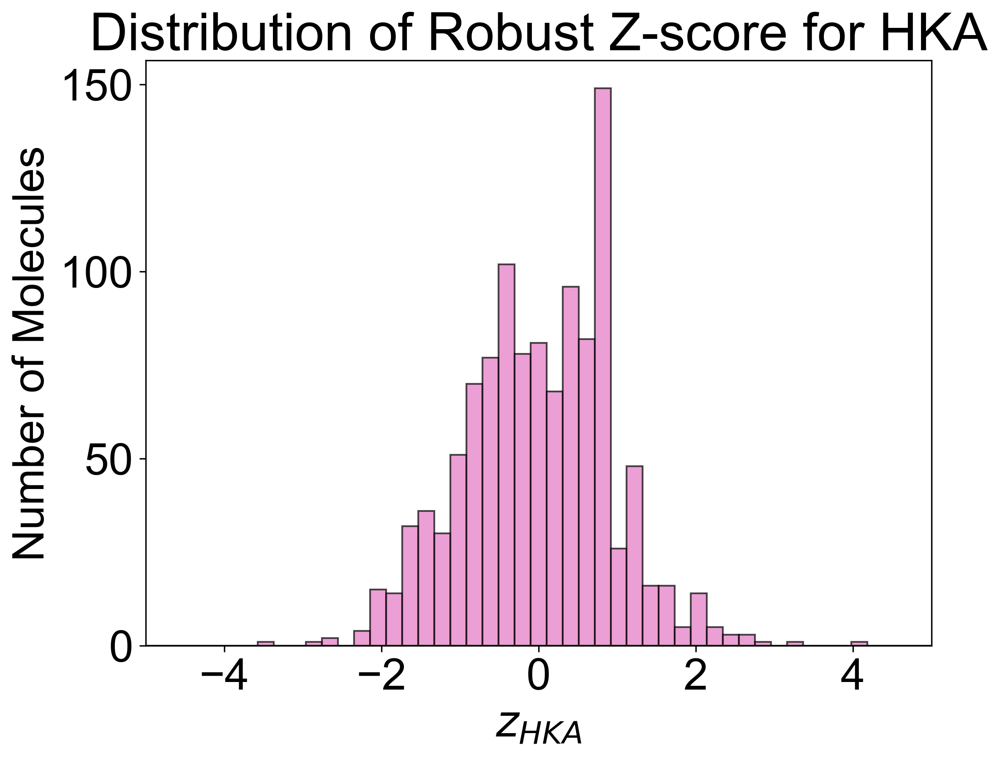

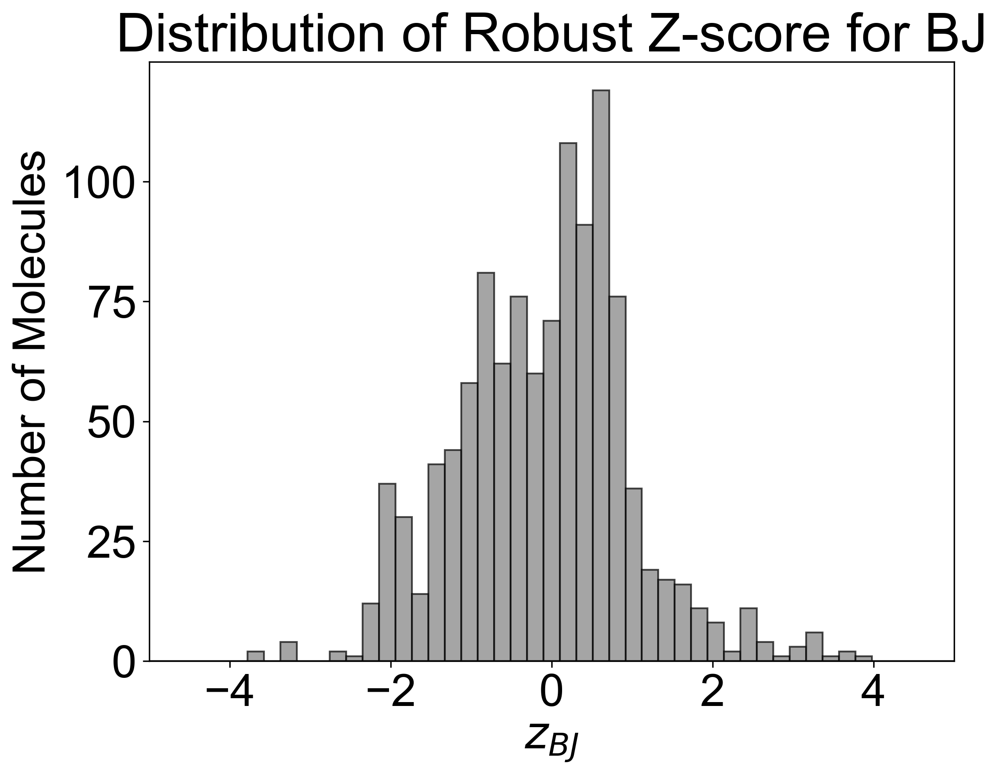

In [3]:
import matplotlib.pyplot as plt
import numpy as np

props = ['Molecular Weight', 'LogP', 'sp3', 'TPSA', 'MolMR', 'Chi', 'HKA', 'BJ']
xlabels = [r'$z_{MW}$', r'$z_{logP}$', r'$z_{sp3}$', r'$z_{TPSA}$', r'$z_{MR}$', r'$z_{Chi1v}$', r'$z_{HKA}$', r'$z_{BJ}$']
names = ['MW', 'logP', 'sp3', 'TPSA', 'MR', 'Chi1v', 'HKA', 'BJ']

bins = np.linspace(-5, 5, 50)
for i in range(len(props)):
    plt.figure(figsize=(8, 6), dpi=300)
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 25
    prop = props[i]
    plt.hist(esol[f'{prop}_robust_zscore'], bins=bins, alpha=0.7, color=f'C{i}', edgecolor='black')
    plt.xlim(-5, 5)
    plt.xlabel(xlabels[i])
    title = f'Distribution of Robust Z-score for {names[i]}'
    plt.title(title)
    plt.ylabel('Number of Molecules')
    plt.show()

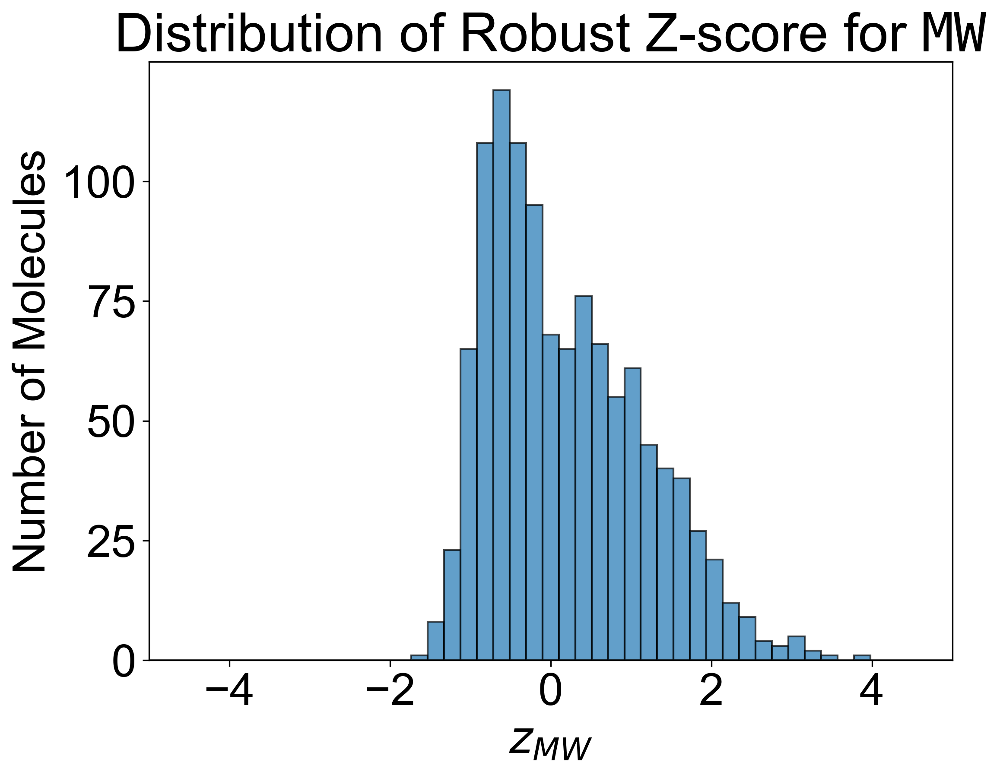

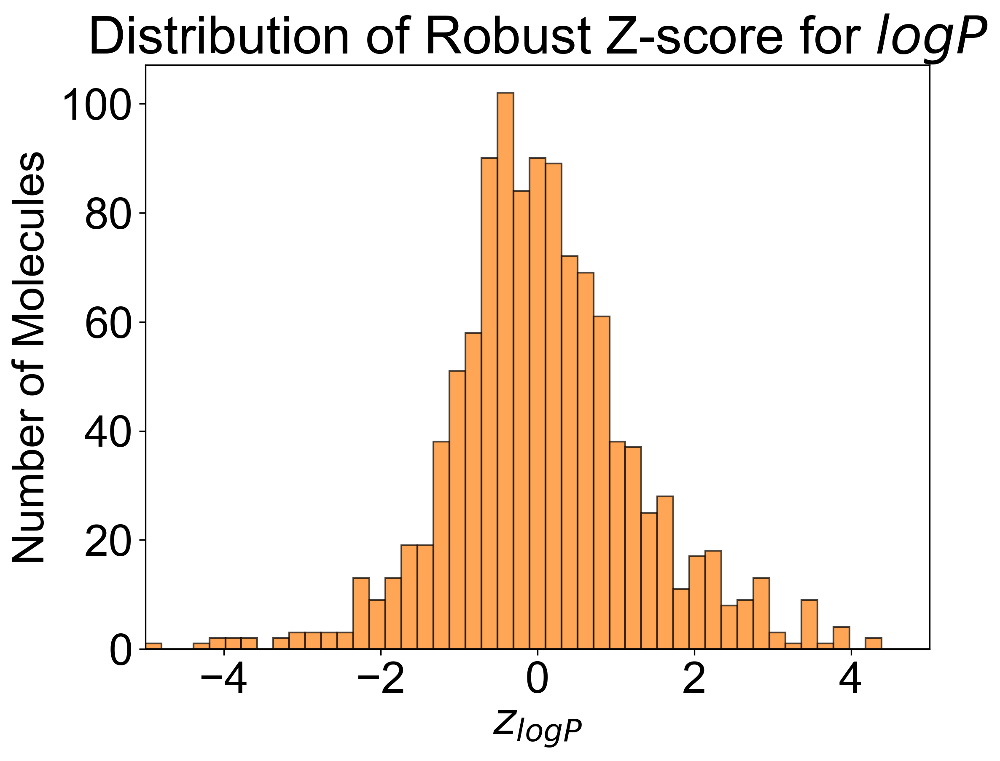

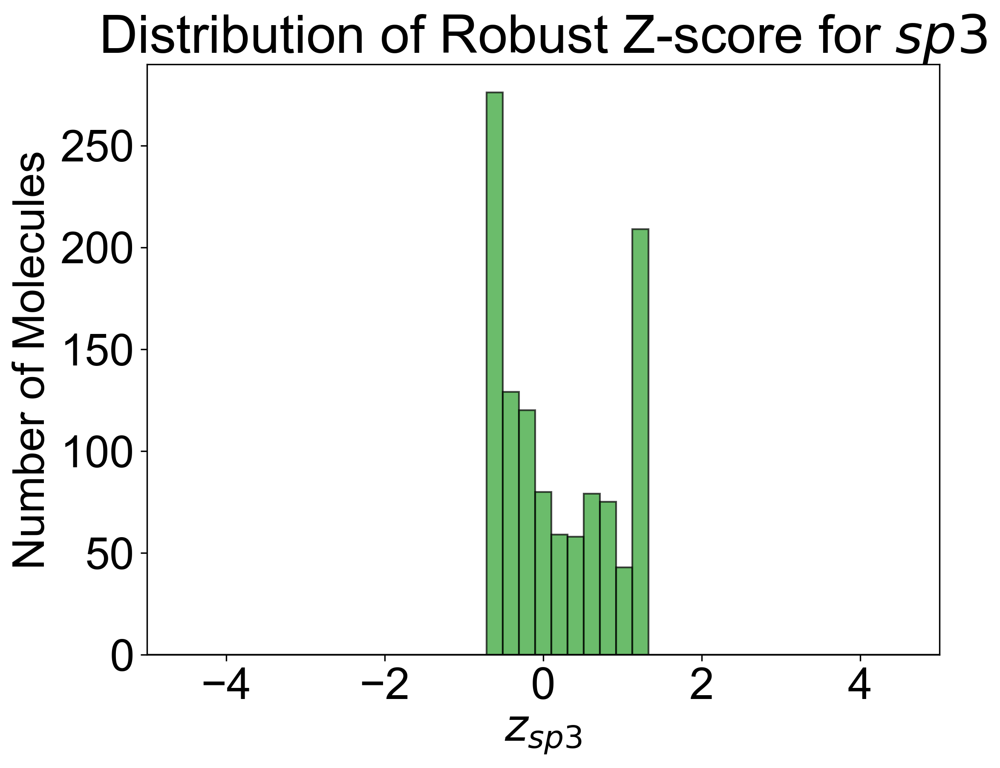

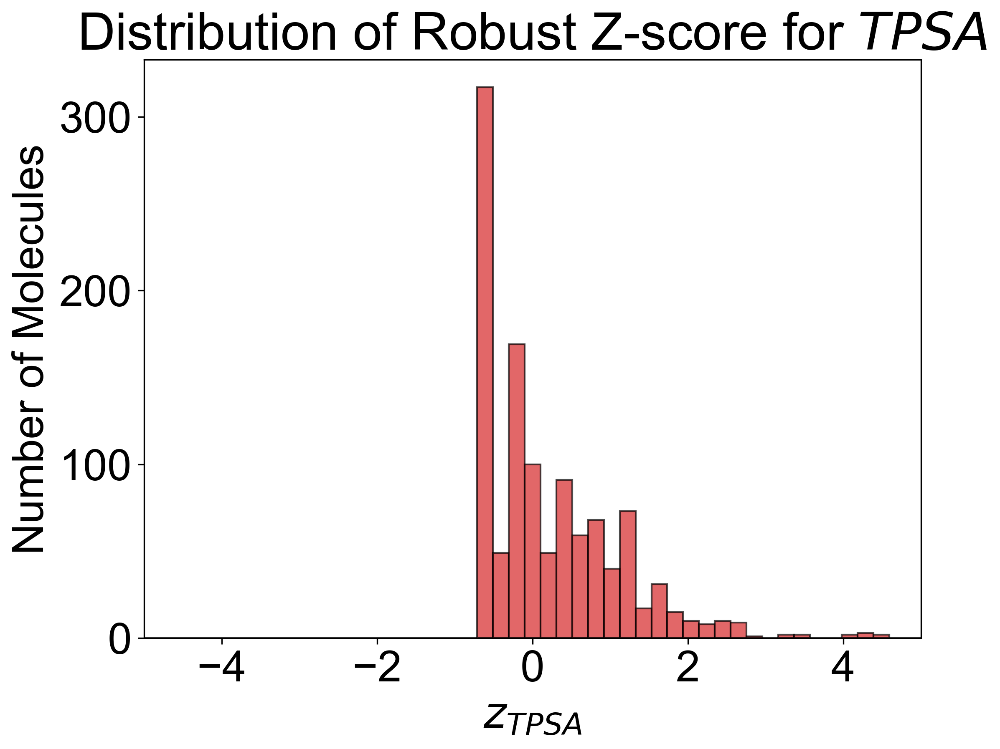

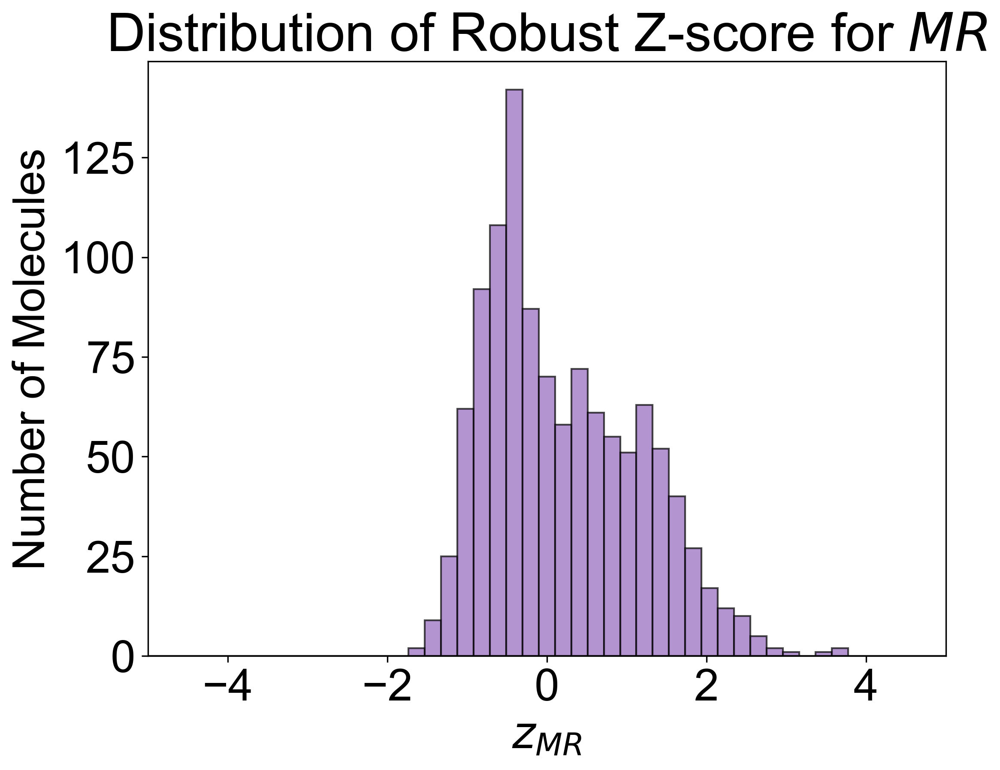

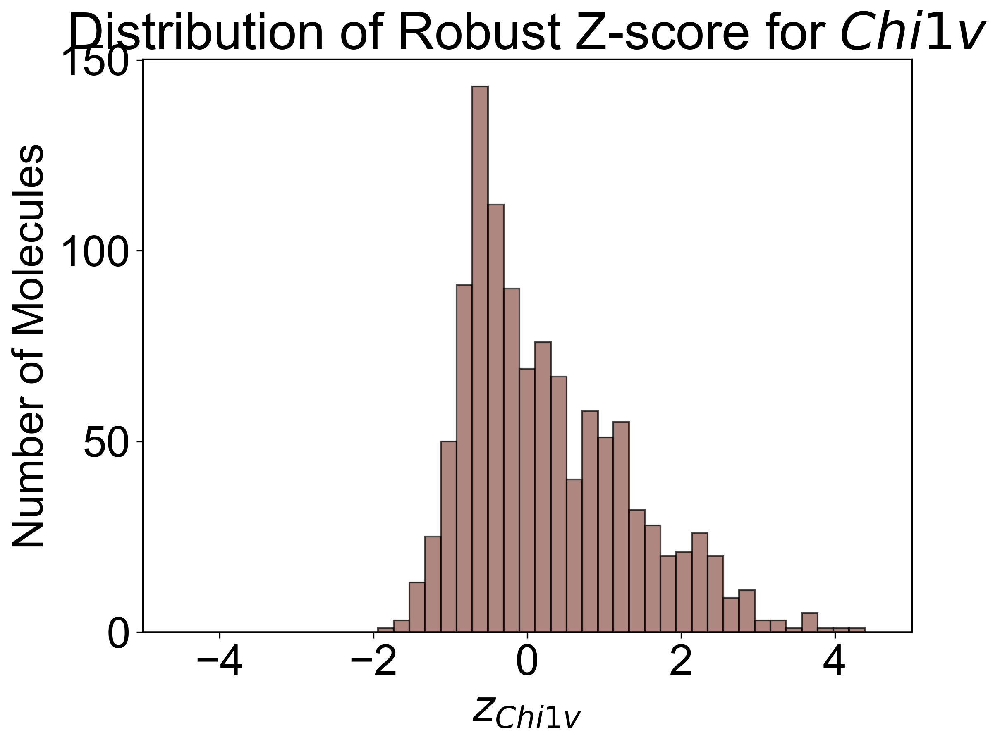

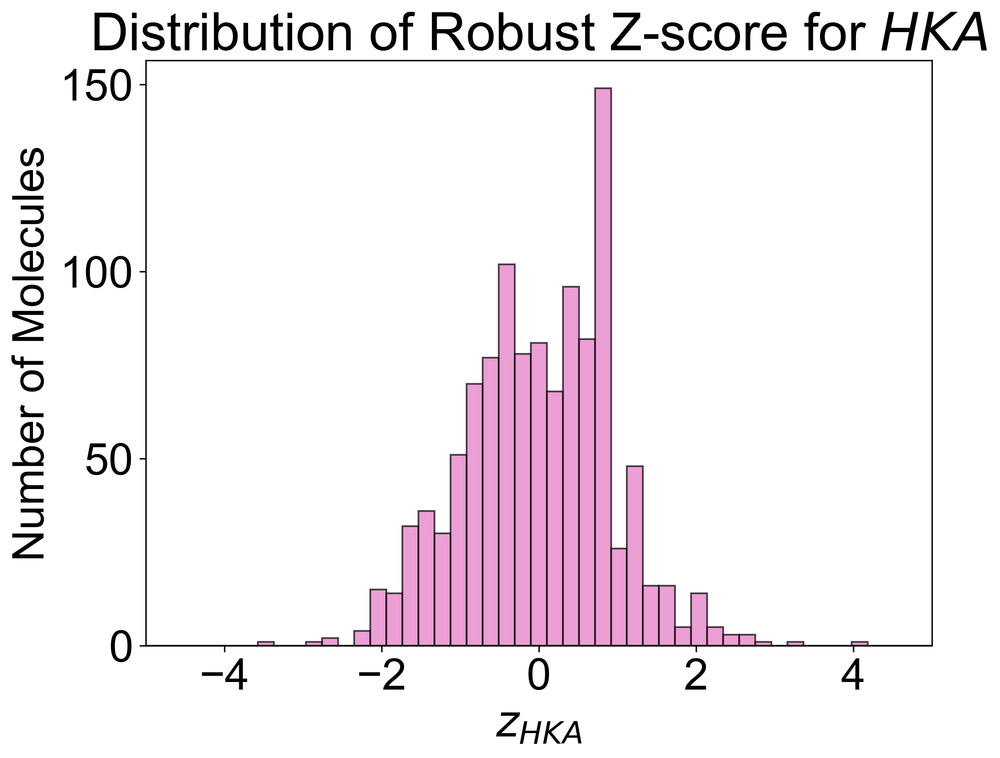

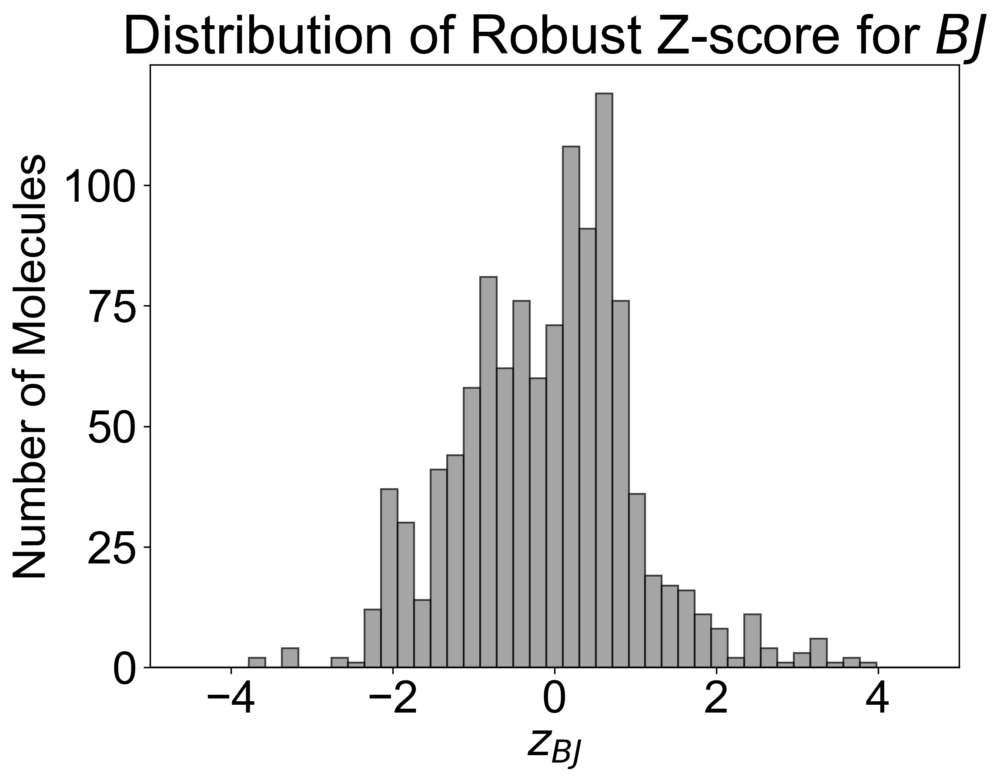

In [5]:
import matplotlib.pyplot as plt
import numpy as np

props = ['Molecular Weight', 'LogP', 'sp3', 'TPSA', 'MolMR', 'Chi', 'HKA', 'BJ']
xlabels = [r'$z_{MW}$', r'$z_{logP}$', r'$z_{sp3}$', r'$z_{TPSA}$', r'$z_{MR}$', r'$z_{Chi1v}$', r'$z_{HKA}$', r'$z_{BJ}$']
names = ['$\mathtt{MW}$', '$logP$', '$sp3$', '$TPSA$', '$MR$', '$Chi1v$', '$HKA$', '$BJ$']

bins = np.linspace(-5, 5, 50)
for i in range(len(props)):
    plt.figure(figsize=(8, 6), dpi=300)
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 25
    prop = props[i]
    plt.hist(esol[f'{prop}_robust_zscore'], bins=bins, alpha=0.7, color=f'C{i}', edgecolor='black')
    plt.xlim(-5, 5)
    plt.xlabel(xlabels[i])
    title = f'Distribution of Robust Z-score for {names[i]}'
    plt.title(title)
    plt.ylabel('Number of Molecules')
    plt.show()

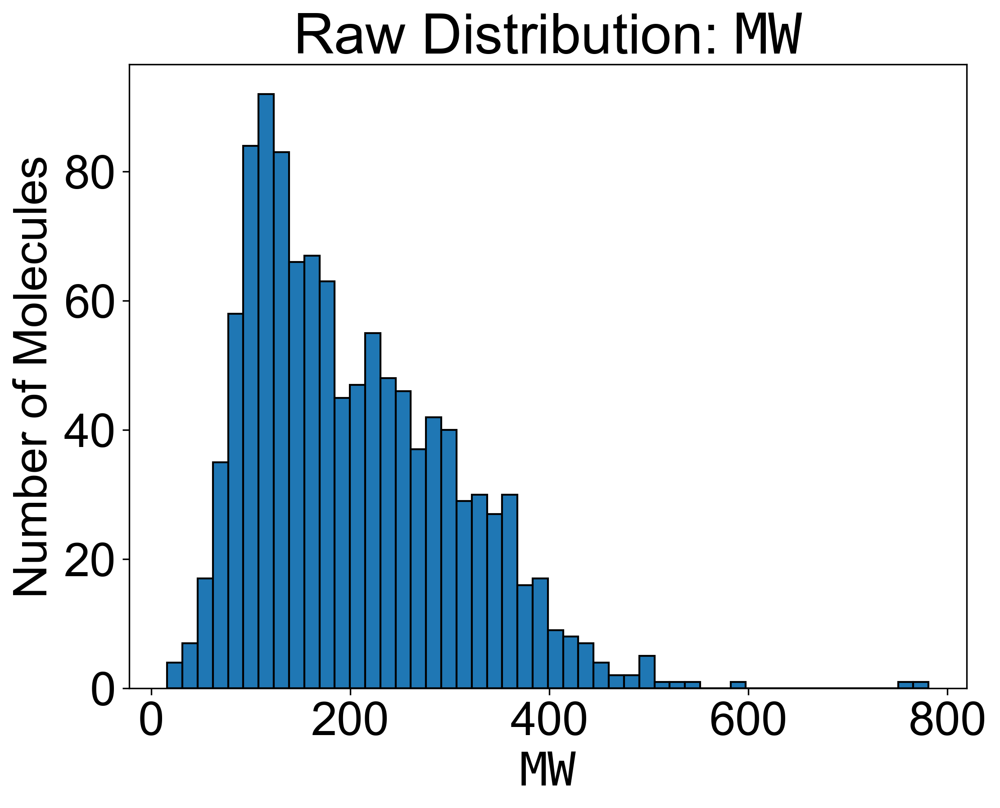

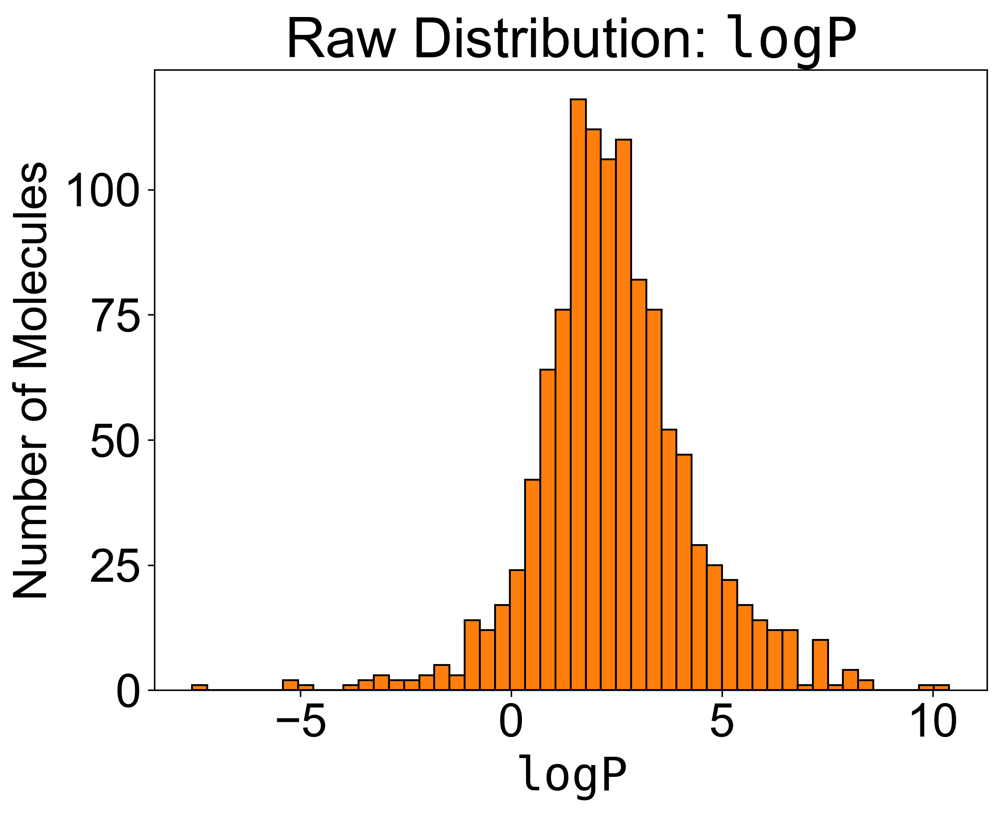

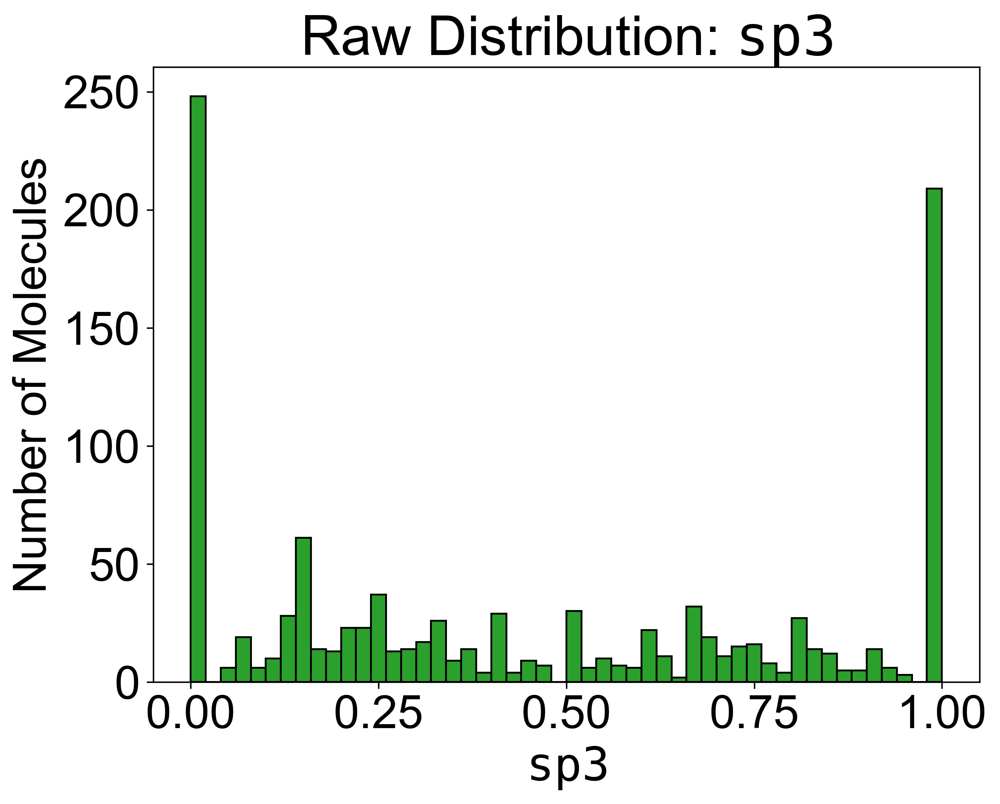

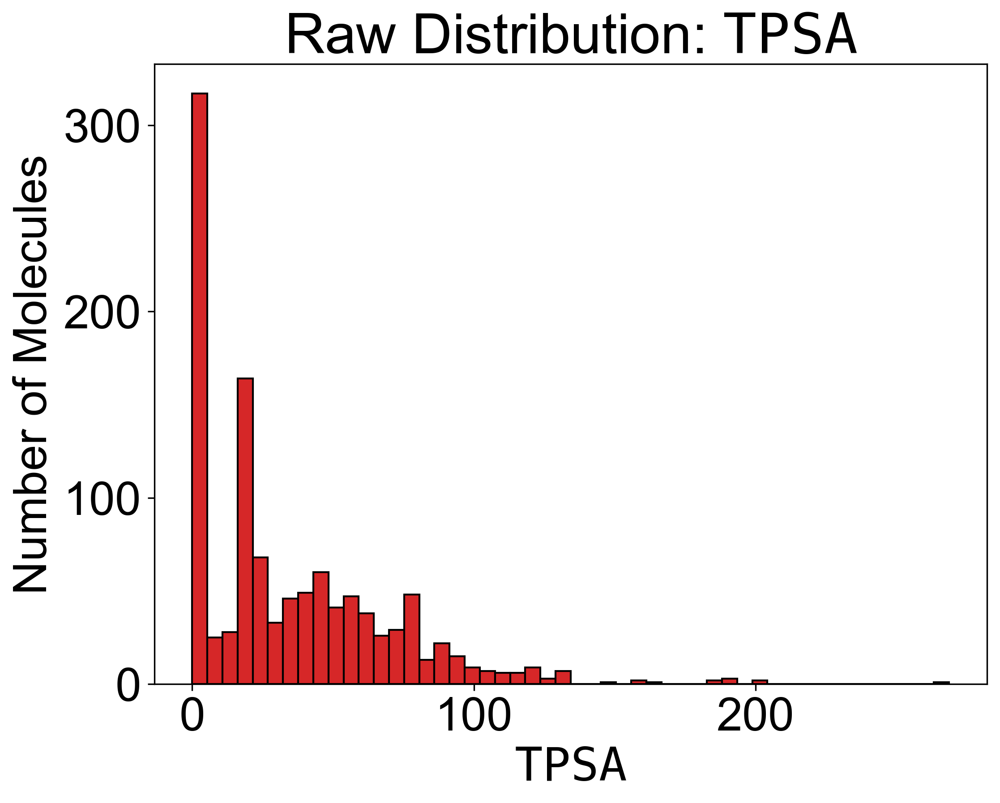

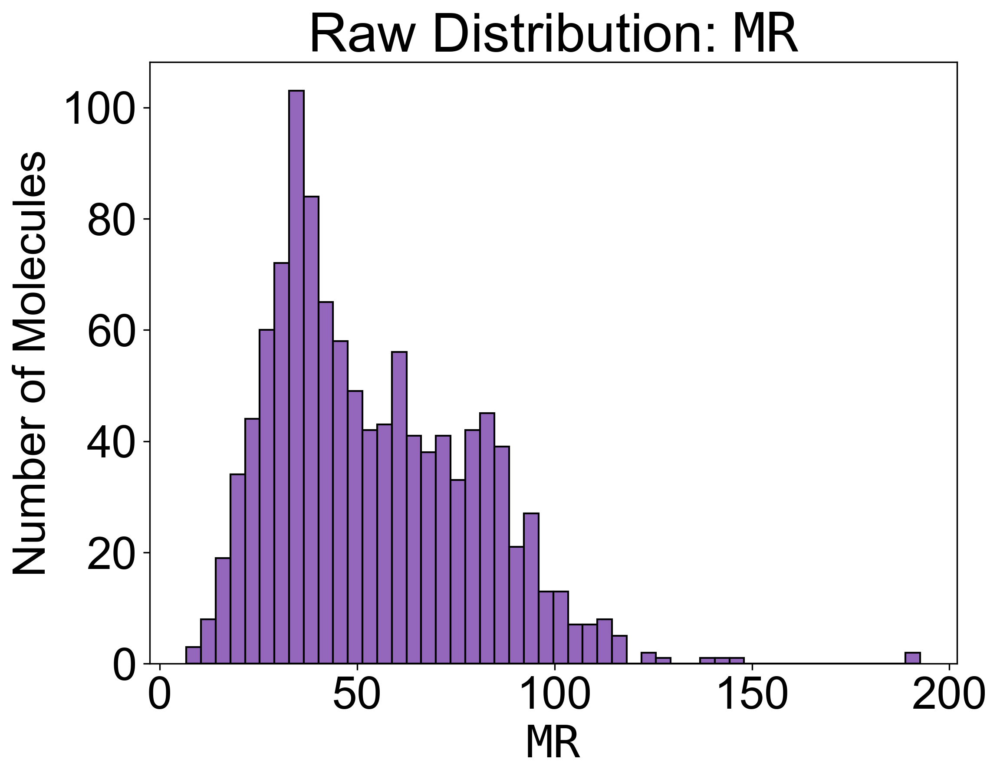

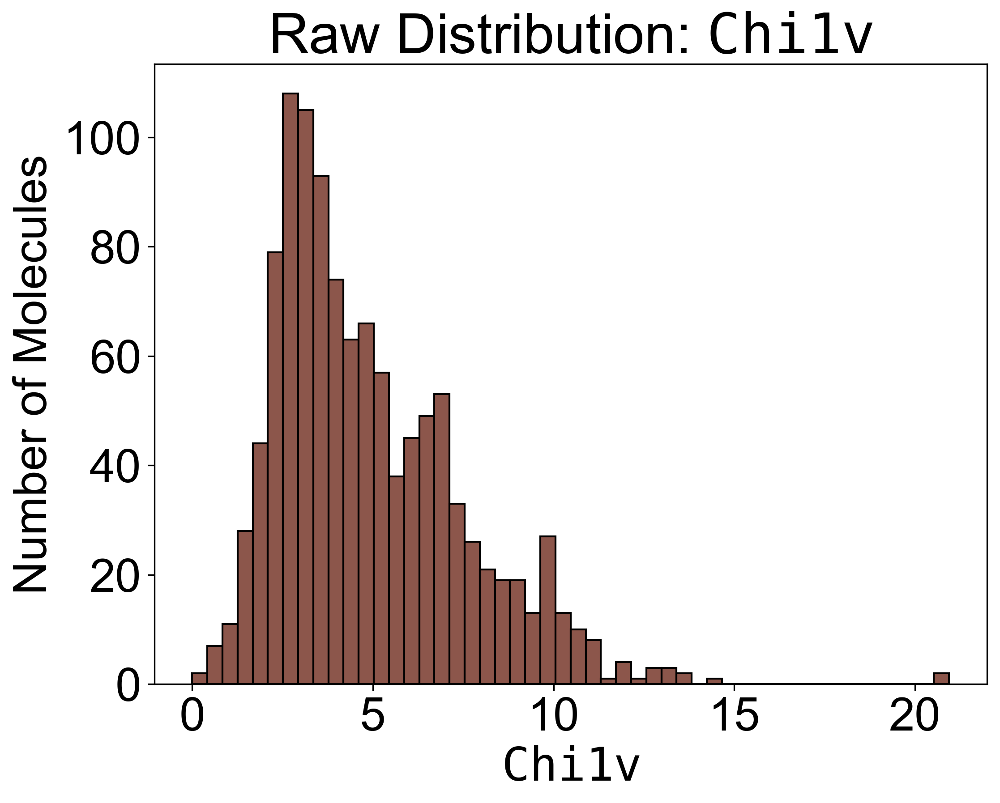

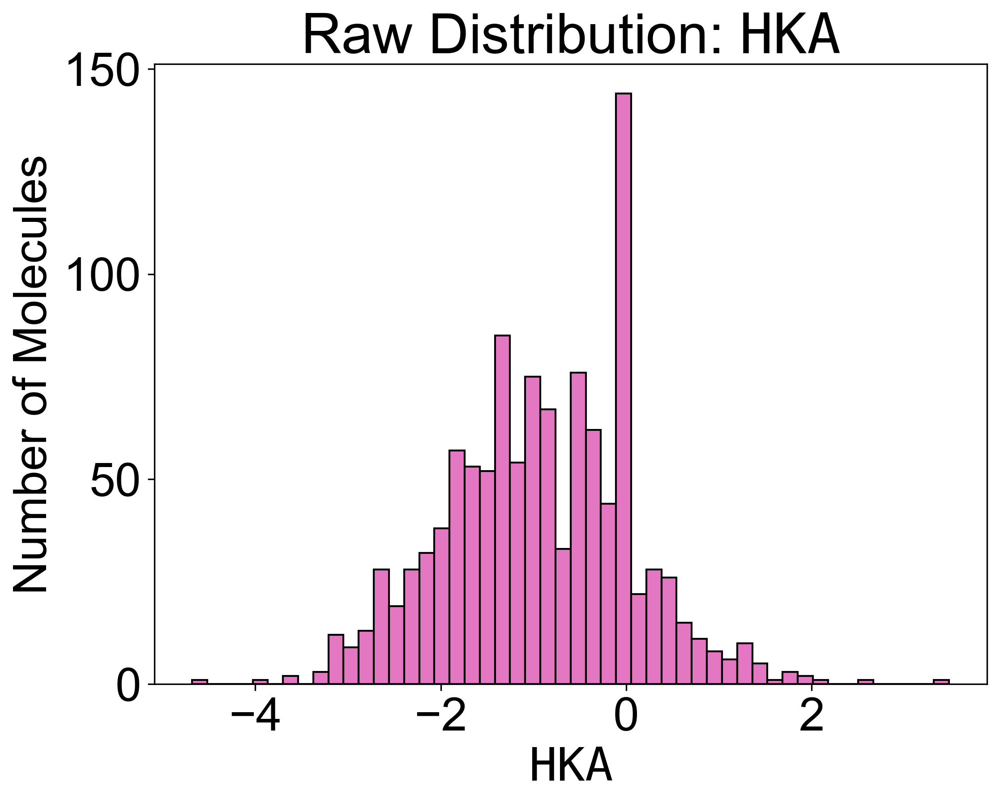

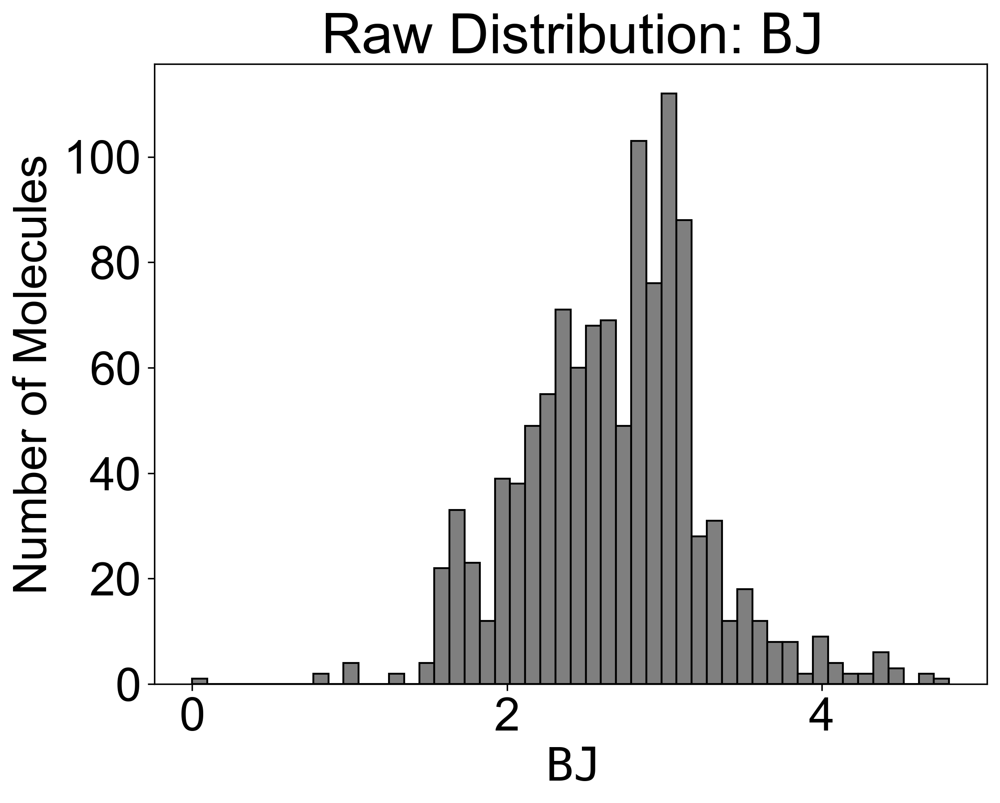

In [13]:
props = ['Molecular Weight', 'LogP', 'sp3', 'TPSA', 'MolMR', 'Chi', 'HKA', 'BJ']
# plt.hist(esol[f'{prop}_robust_zscore']*esol[f'{prop}_robust_zscore'], bins=50, alpha=0.7, color='green', edgecolor='black')
# xlabels = [r'$z_\mathtt{MW}$', r'$z_\mathtt{logP}$', r'$z_\mathtt{sp3}$', r'$z_\mathtt{TPSA}$', r'$z_\mathtt{MR}$',r'$z_\mathtt{Chi1v}$', r'$z_\mathtt{HKA}$', r'$z_\mathtt{BJ}$']
xlabels = [r'$\mathtt{MW}$', r'$\mathtt{logP}$', r'$\mathtt{sp3}$', r'$\mathtt{TPSA}$', r'$\mathtt{MR}$', r'$\mathtt{Chi1v}$', r'$\mathtt{HKA}$', r'$\mathtt{BJ}$']
# names = ['MW', 'logP', 'sp3', 'TPSA', 'MR', 'Chi', 'HKA', 'BJ']
names = [r'Raw Distribution: $\mathtt{MW}$', 
         r'Raw Distribution: $\mathtt{logP}$', 
         r'Raw Distribution: $\mathtt{sp3}$', 
         r'Raw Distribution: $\mathtt{TPSA}$',
         r'Raw Distribution: $\mathtt{MR}$', 
         r'Raw Distribution: $\mathtt{Chi1v}$', 
         r'Raw Distribution: $\mathtt{HKA}$', 
         r'Raw Distribution: $\mathtt{BJ}$']
# bins = np.linspace(-5, 5, 50)
for i in range(len(props)):
    plt.figure(figsize=(8, 6), dpi=300)
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 25
    prop = props[i]
    plt.hist(esol[f'{prop}'], bins=50, color=f'C{i}', edgecolor='black')
    # plt.xlim(-5, 5)
    plt.xlabel(xlabels[i])
    plt.title(names[i])
    plt.ylabel('Number of Molecules')
    plt.show()
# plt.show()